<div align="center" style="font-family: Georgia, serif; color: #555555;">
    <p style="font-size: 36px; font-weight: bold; color: #FF0000;">数据可视化技术</p>
    <p style="font-size: 30px; font-weight: bold; color: #FF0000;">Data Visualization Techniques</p>
</div>

---

<div align="center" style="font-family: 'Helvetica Neue', Helvetica, Arial, sans-serif;">
    <p style="font-size: 18px; font-weight: bold; color: black;">
        <strong>主讲人:</strong> 高俊莲 (<a href="mailto:junliangao@cumtb.edu.cn" style="color: #0000FF;">junliangao@cumtb.edu.cn</a>)
        - <a href="https://glxy.cumtb.edu.cn/info/1133/2192.htm" target="_blank" style="color: #0000FF;">个人主页</a>
    </p>
    <p style="font-size: 18px; font-weight: bold;">
        <strong>学校:</strong> 中国矿业大学（北京）<br>
    </p>
    <p style="font-size: 18px; font-weight: bold;">
        <strong>学院:</strong> 管理学院
    </p>
</div>

# 基础用法——生成词云图

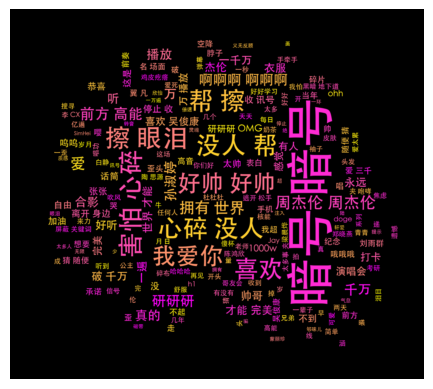

In [42]:
%matplotlib inline
# 第一步：导入基础库
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
plt.rcParams['font.sans-serif'] = ['SimHei']  # 使用黑体显示中文
plt.rcParams['axes.unicode_minus'] = False    # 正常显示负号
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from wordcloud import WordCloud
import jieba  # 中文分词
import warnings
warnings.filterwarnings('ignore')
pic = np.array(Image.open("img/converted_img/flower.png"))
#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',colormap='spring',
                         width=800, height=100,
                         collocations=True,
                         mask=pic
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

# WordCloud类形参说明

## 常用参数

### 字体 font_path

#### 📌 参数含义：
`font_path` 是 WordCloud 类中最重要的参数之一，它用于指定生成词云时所使用的**字体文件**（.ttf 或 .ttc）。

#### ❗ 为什么要指定 font_path？
- 默认字体不支持中文！
- 不设置 `font_path`，生成中文词云时会出现乱码或空白
- 推荐使用系统中常见的中文字体，如黑体（`simhei.ttf`）


      
 

#### ✅ 字体路径设置方式：
你可以：
1. 将字体文件复制到项目目录下，使用相对路径  
2. 指定系统中的绝对路径，如：

- Windows: `C:/Windows/Fonts/simhei.ttf`
- macOS: `/System/Library/Fonts/STHeiti Medium.ttc`

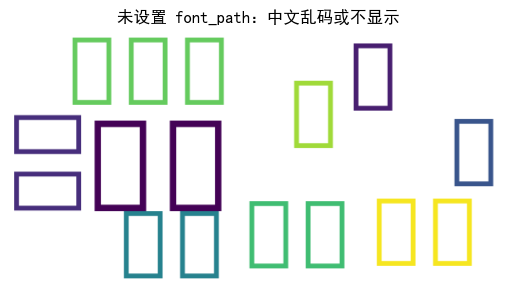

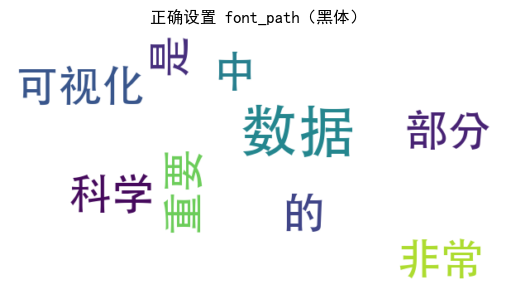

In [11]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

text = "数据可视化是数据科学中非常重要的部分"

# 中文分词
words = " ".join(jieba.lcut(text))

# 错误示范：不指定字体 → 中文乱码或空白
wc_default = WordCloud(background_color="white", width=600, height=300)
try:
    wc_default.generate(words)
    plt.imshow(wc_default, interpolation="bilinear")
    plt.title("未设置 font_path：中文乱码或不显示")
    plt.axis("off")
    plt.show()
except Exception as e:
    print("⚠️ 生成失败：", e)

# 正确示范：设置 font_path
wc_chinese = WordCloud(font_path="/System/Library/Fonts/STHeiti Medium.ttc", background_color="white", width=600, height=300)
wc_chinese.generate(words)

plt.imshow(wc_chinese, interpolation="bilinear")
plt.title("正确设置 font_path（黑体）")
plt.axis("off")
plt.show()


### 画布尺寸 width、hight

#### 📌 参数作用：
- `width` 和 `height` 决定了生成词云图的 **画布像素大小**（单位为像素 px）
- 它控制的是 **图像分辨率**，而不是字体大小
- 通常用来适配你的输出设备（如 PPT、网页或海报展示）

#### 🧠 教学重点：
- 画布越大，**可容纳的词越多**，排布越松
- 画布太小 → 词被挤在一起、不完整或不显示
- width : int (default=400)；height : int (default=200) 
- 一般推荐：`width=800`，`height=400`（16:9标准适合大多数场景）

In [22]:
from wordcloud import WordCloud
import jieba

# 示例文本
text = "数据可视化是将复杂的数据转化为直观图形，帮助人们发现规律、支持决策、传递信息的重要手段。"
words = " ".join(jieba.lcut(text))

# 替换为你本地的中文字体路径
font_path = "/System/Library/Fonts/STHeiti Medium.ttc"  # 或 "C:/Windows/Fonts/simhei.ttf"、"msyh.ttc"

# 保存小画布词云图
wc_small = WordCloud(font_path=font_path, background_color="white", width=300, height=150)
wc_small.generate(words)
wc_small.to_file("img/wordcloud_small_300x150.png")

# 保存中等画布词云图
wc_medium = WordCloud(font_path=font_path, background_color="white", width=600, height=300)
wc_medium.generate(words)
wc_medium.to_file("img/wordcloud_medium_600x300.png")

# 保存大画布词云图
wc_large = WordCloud(font_path=font_path, background_color="white", width=900, height=450)
wc_large.generate(words)
wc_large.to_file("img/wordcloud_large_900x450.png")


### 比例（缩放）scale

#### 📌 参数含义：
- `scale` 控制的是词云图像的**放大倍数**（相对于 `width × height` 的画布）。
- 默认为 `1`，表示**不放大**。
- 设置为 `2` 表示生成的图像将会是画布的 2 倍大小，然后再缩放回指定大小显示。

#### 🧠 作用：
- 提高图像的 **清晰度/抗锯齿性**，尤其是在高分辨率设备（如 Retina 显示屏）或导出用于打印时非常有用。
- 类似“高清输出”，但不改变图中内容的布局。

#### 🎯 使用建议：
- 在做 **海报展示 / PPT 投影 / 高质量导出** 时，推荐设置 `scale=2` 或更高。
- 如果你导出 `.png` 或 `.pdf`，较高 `scale` 能提升清晰度。
- 为了提高生成速度，可以选择在计算时使用缩放（即在较小的尺寸上进行计算，然后再放大到需要的尺寸），而不是一开始就使用一个大的画布进行计算和绘制。
- 使用缩放的方法可以显著提高生成词云图像的速度，因为在较小的尺寸上进行计算和绘图所需的资源和时间都更少。
- 然而，使用缩放的方法可能会导致单词的排列精度降低。因为在较小的尺寸上计算时，单词的位置和间距可能不如在大尺寸上计算时那样精确，放大后可能会显得比较粗糙。

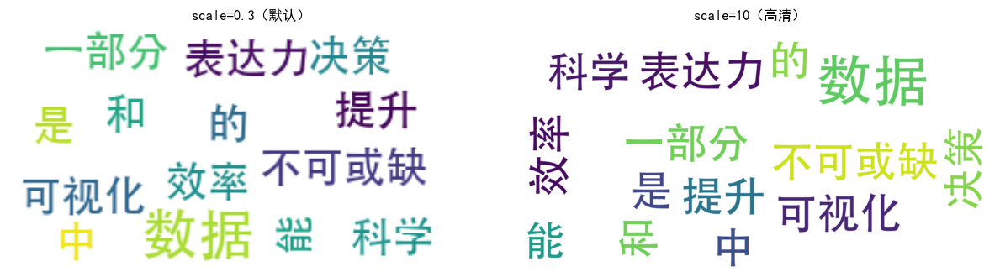

In [12]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

text = "数据可视化是数据科学中不可或缺的一部分，能提升表达力和决策效率。"
words = " ".join(jieba.lcut(text))

# 普通 scale=1
wc_normal = WordCloud(font_path="/System/Library/Fonts/STHeiti Medium.ttc", background_color="white",
                      width=600, height=300, scale=0.5)
wc_normal.generate(words)

# 高清 scale=2
wc_scaled = WordCloud(font_path="/System/Library/Fonts/STHeiti Medium.ttc", background_color="white",
                      width=600, height=300, scale=8)
wc_scaled.generate(words)

# 可视化对比
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(wc_normal, interpolation="bilinear")
axes[0].set_title("scale=0.3（默认）")
axes[0].axis("off")

axes[1].imshow(wc_scaled, interpolation="bilinear")
axes[1].set_title("scale=10（高清）")
axes[1].axis("off")

plt.tight_layout()
plt.show()


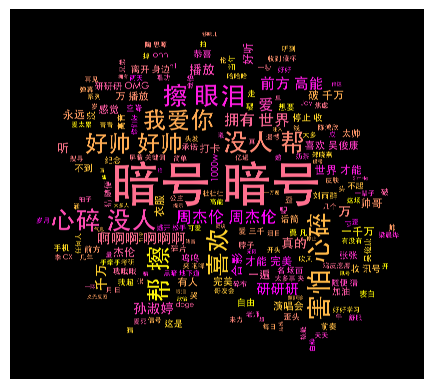

In [24]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/flower.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='spring',
                         width=800, height=400,
                         collocations=True,
                         scale = 8,
                         mask=pic
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
#plt.savefig("img/jay.png")
plt.axis("off")
plt.show()

### 🎨 WordCloud 参数讲解：colormap（颜色映射表）

 >colormap : string or matplotlib colormap, default="viridis"  
- colormap 参数允许用户指定一个 matplotlib 颜色映射来为词云中的单词随机分配颜色。
- 如果同时指定了 color_func 参数，则 colormap 参数将被忽略。
- color_func 是一个函数，用于自定义如何为每个单词分配颜色。
    - 通过 color_func，用户可以完全控制每个单词的颜色分配逻辑，例如根据单词的频率、位置或其他特征来决定颜色。

#### 📌 参数含义：
- `colormap` 是 Matplotlib 中内置的颜色映射方案（colormaps）
- 它决定了词云中所有词的颜色范围和渐变风格
- 适用于不指定 `color_func` 时的默认配色

#### 🎯 常用的 colormap 示例：

| 名称        | 色调特点         |
|-------------|------------------|
| `viridis`   | 黄绿蓝渐变（默认） |
| `plasma`    | 橙红紫亮色系     |
| `Blues`     | 浅蓝到深蓝       |
| `Greens`    | 浅绿到深绿       |
| `Set2`      | 柔和分类色       |
| `Pastel1`   | 粉系淡色         |
| `coolwarm`  | 冷暖对比         |

### ✅ 推荐使用：
- 想要快速生成具有统一色调的美观词云图
- 不打算为每个词单独定义颜色时

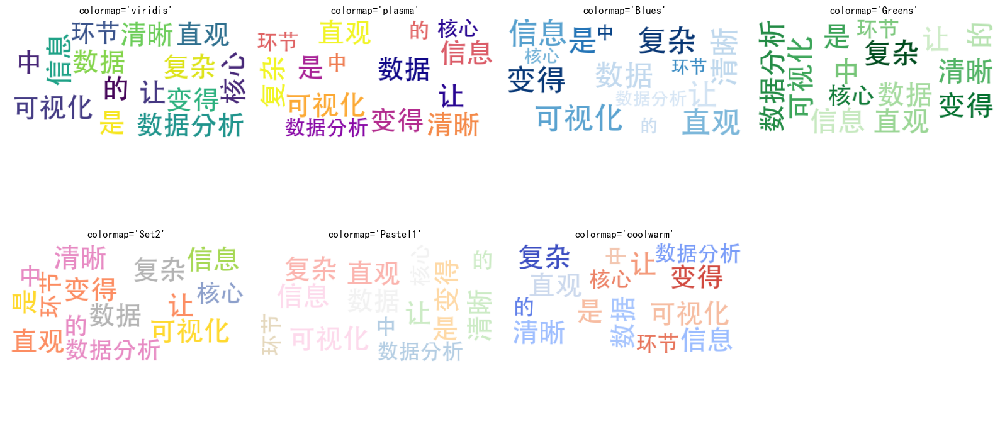

In [40]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import jieba

text = "数据可视化让复杂信息变得清晰直观，是数据分析中的核心环节。"
words = " ".join(jieba.lcut(text))

# 可选 colormap 列表
colormaps = ["viridis", "plasma", "Blues", "Greens", "Set2", "Pastel1", "coolwarm"]

# 绘制对比图
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for ax, cmap in zip(axes.flat, colormaps):
    wc = WordCloud(
        font_path="/System/Library/Fonts/STHeiti Medium.ttc",
        background_color="white",
        colormap=cmap,
        width=400, height=200
    ).generate(words)
    ax.imshow(wc, interpolation="bilinear")
    ax.set_title(f"colormap='{cmap}'")
    ax.axis("off")

# 清空最后一个空格（如果图像不足8个）
for ax in axes.flat[len(colormaps):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


In [7]:
from matplotlib import colormaps
list(colormaps)

['magma',
 'inferno',
 'plasma',
 'viridis',
 'cividis',
 'twilight',
 'twilight_shifted',
 'turbo',
 'Blues',
 'BrBG',
 'BuGn',
 'BuPu',
 'CMRmap',
 'GnBu',
 'Greens',
 'Greys',
 'OrRd',
 'Oranges',
 'PRGn',
 'PiYG',
 'PuBu',
 'PuBuGn',
 'PuOr',
 'PuRd',
 'Purples',
 'RdBu',
 'RdGy',
 'RdPu',
 'RdYlBu',
 'RdYlGn',
 'Reds',
 'Spectral',
 'Wistia',
 'YlGn',
 'YlGnBu',
 'YlOrBr',
 'YlOrRd',
 'afmhot',
 'autumn',
 'binary',
 'bone',
 'brg',
 'bwr',
 'cool',
 'coolwarm',
 'copper',
 'cubehelix',
 'flag',
 'gist_earth',
 'gist_gray',
 'gist_heat',
 'gist_ncar',
 'gist_rainbow',
 'gist_stern',
 'gist_yarg',
 'gnuplot',
 'gnuplot2',
 'gray',
 'hot',
 'hsv',
 'jet',
 'nipy_spectral',
 'ocean',
 'pink',
 'prism',
 'rainbow',
 'seismic',
 'spring',
 'summer',
 'terrain',
 'winter',
 'Accent',
 'Dark2',
 'Paired',
 'Pastel1',
 'Pastel2',
 'Set1',
 'Set2',
 'Set3',
 'tab10',
 'tab20',
 'tab20b',
 'tab20c',
 'grey',
 'gist_grey',
 'gist_yerg',
 'Grays',
 'magma_r',
 'inferno_r',
 'plasma_r',
 'viri

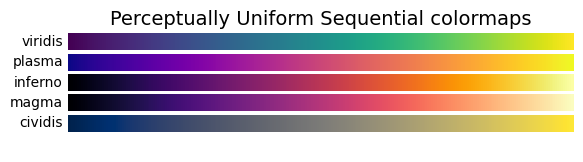

In [13]:
from colorspacious import cspace_converter

import matplotlib.pyplot as plt
import numpy as np

import matplotlib as mpl
cmaps = {}

gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))


def plot_color_gradients(category, cmap_list):
    # Create figure and adjust figure height to number of colormaps
    nrows = len(cmap_list)
    figh = 0.35 + 0.15 + (nrows + (nrows - 1) * 0.1) * 0.22
    fig, axs = plt.subplots(nrows=nrows + 1, figsize=(6.4, figh))
    fig.subplots_adjust(top=1 - 0.35 / figh, bottom=0.15 / figh,
                        left=0.2, right=0.99)
    axs[0].set_title(f'{category} colormaps', fontsize=14)

    for ax, name in zip(axs, cmap_list):
        ax.imshow(gradient, aspect='auto', cmap=mpl.colormaps[name])
        ax.text(-0.01, 0.5, name, va='center', ha='right', fontsize=10,
                transform=ax.transAxes)

    # Turn off *all* ticks & spines, not just the ones with colormaps.
    for ax in axs:
        ax.set_axis_off()

    # Save colormap list for later.
    cmaps[category] = cmap_list
plot_color_gradients('Perceptually Uniform Sequential',
                     ['viridis', 'plasma', 'inferno', 'magma', 'cividis'])

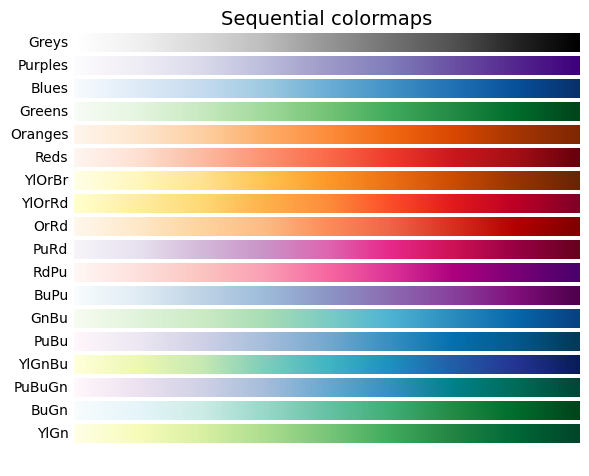

In [14]:
plot_color_gradients('Sequential',
                     ['Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',
                      'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',
                      'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn'])

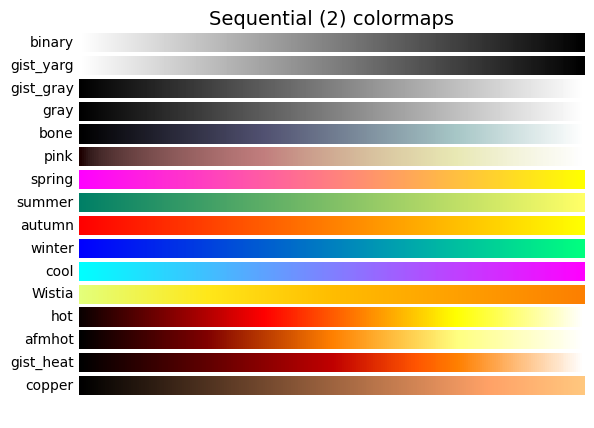

In [15]:
plot_color_gradients('Sequential (2)',
                     ['binary', 'gist_yarg', 'gist_gray', 'gray', 'bone',
                      'pink', 'spring', 'summer', 'autumn', 'winter', 'cool',
                      'Wistia', 'hot', 'afmhot', 'gist_heat', 'copper'])

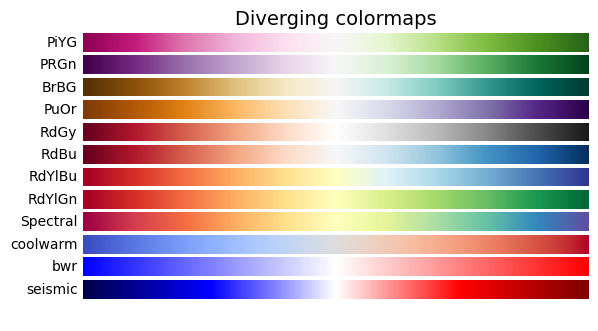

In [16]:
plot_color_gradients('Diverging',
                     ['PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu', 'RdYlBu',
                      'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic'])

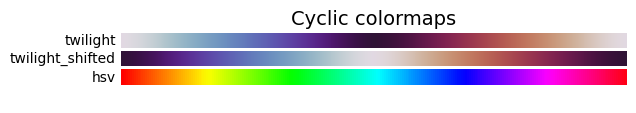

In [17]:
plot_color_gradients('Cyclic', ['twilight', 'twilight_shifted', 'hsv'])

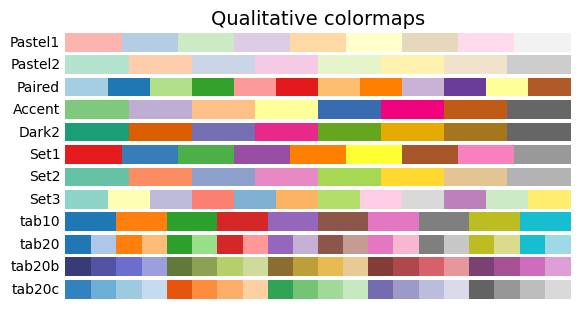

In [18]:
plot_color_gradients('Qualitative',
                     ['Pastel1', 'Pastel2', 'Paired', 'Accent', 'Dark2',
                      'Set1', 'Set2', 'Set3', 'tab10', 'tab20', 'tab20b',
                      'tab20c'])

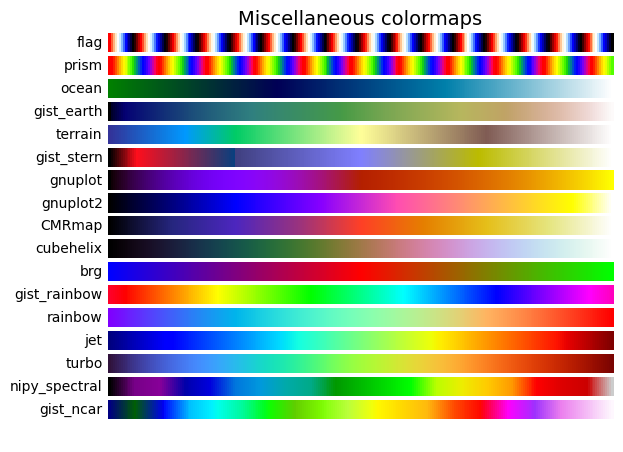

In [19]:
plot_color_gradients('Miscellaneous',
                     ['flag', 'prism', 'ocean', 'gist_earth', 'terrain',
                      'gist_stern', 'gnuplot', 'gnuplot2', 'CMRmap',
                      'cubehelix', 'brg', 'gist_rainbow', 'rainbow', 'jet',
                      'turbo', 'nipy_spectral', 'gist_ncar'])

plt.show()

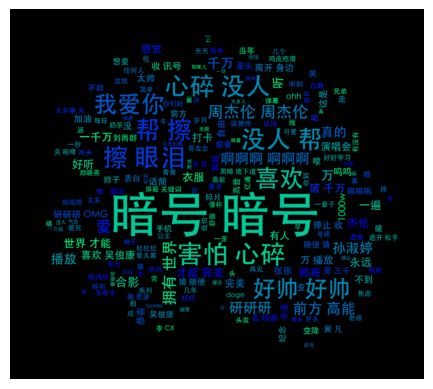

In [76]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/flower.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='winter',
                         width=800, height=400,
                         collocations=True,
                         scale = 1,
                         mask=pic
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🎨 WordCloud 高级配色：color_func（自定义颜色函数）

#### 📌 参数含义：
- `color_func` 是一个函数，用于为词云中 **每个词** 分别指定颜色。
- 该函数接收一个 `wordcloud.WordCloud` 中的词参数，并返回一个颜色字符串（如 `"red"` 或 `rgb(255, 0, 0)`）

#### 🎯 典型用途：
- 强调某类关键词（如情绪、类别、重要性）
- 统一品牌风格（例如所有词为公司蓝）
- 制作多彩创意风格（每个词不同颜色）

In [41]:
def my_color_func(word, font_size, position, orientation, font_path, random_state):
    return "rgb(255, 0, 0)"  # 所有词都用红色

- color_func 接收以下参数：

  - word: 当前词云中的词。
  - font_size: 该词在词云中的字体大小。
  - position: 该词在词云中的位置。通常是一个包含 (x, y) 坐标的元组。
  - orientation: 该词的方向。可能的值包括水平和垂直。
  - font_path: 字体文件的路径。
  - random_state: 随机数生成器的状态，用于保持词云生成的一致性。
- 返回值
  - color_func 应返回一个 PIL 颜色对象或一个 RGB 颜色值。例如：
- 注意事项
  - 使用 color_func 时，会覆盖 colormap 参数。
  - 如果你只想用单一颜色，可以用 lambda 表达式直接返回颜色值。

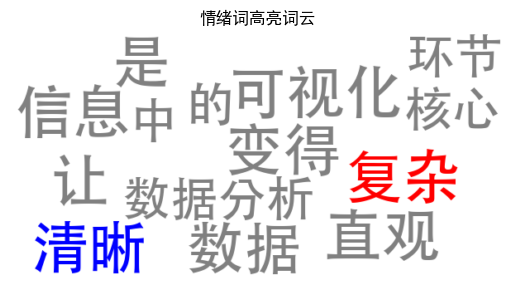

In [44]:
positive_words = {"幸福", "快乐", "清晰"}
negative_words = {"失败", "痛苦", "复杂"}

def emotion_color_func(word, *args, **kwargs):
    if word in positive_words:
        return "blue"
    elif word in negative_words:
        return "red"
    else:
        return "gray"

wc = WordCloud(font_path="/System/Library/Fonts/STHeiti Medium.ttc", background_color="white",
               width=600, height=300, color_func=emotion_color_func)
wc.generate(words)

plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("情绪词高亮词云")
plt.show()


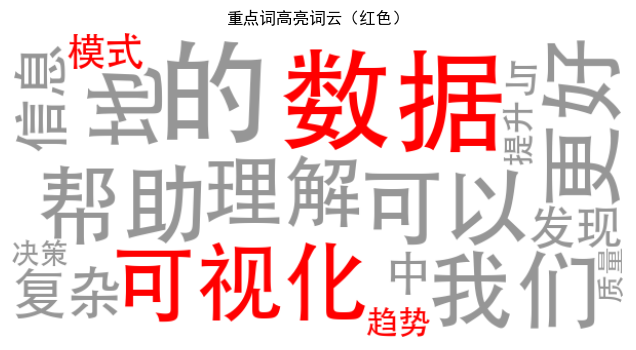

In [48]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

# 示例文本
text = "数据可视化可以帮助我们更好地理解复杂的信息，发现数据中的模式与趋势，提升决策质量。"
words = " ".join(jieba.lcut(text))

# 重点关键词列表
important_words = {"数据", "可视化", "趋势", "模式"}

# 自定义颜色函数
def highlight_keywords(word, font_size, position, orientation, font_path, random_state):
    if word in important_words:
        return "rgb(255, 0, 0)"  # 红色突出
    else:
        return "rgb(150, 150, 150)"  # 灰色为背景词

# 创建词云图对象
wc = WordCloud(
    font_path="/System/Library/Fonts/STHeiti Medium.ttc",         # Windows 或项目目录下需有该字体
    background_color="white",
    width=600,
    height=300,
    color_func=highlight_keywords
)

wc.generate(words)

# 显示词云图
plt.figure(figsize=(8, 4))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("重点词高亮词云（红色）")
plt.show()


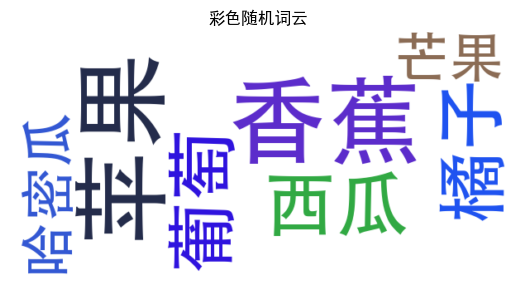

In [52]:
import random

def random_color_func(word, *args, **kwargs):
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    return f"rgb({r}, {g}, {b})"
words = "苹果 香蕉 苹果 橘子 香蕉 香蕉 葡萄 西瓜 苹果 橘子 芒果 葡萄 西瓜 哈密瓜 苹果 香蕉"
wc = WordCloud(font_path="/System/Library/Fonts/STHeiti Medium.ttc", background_color="white",
               width=600, height=300, color_func=random_color_func)
wc.generate(words)

plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("彩色随机词云")
plt.show()

**示例：**
>color_func=lambda *args, **kwargs: "white"

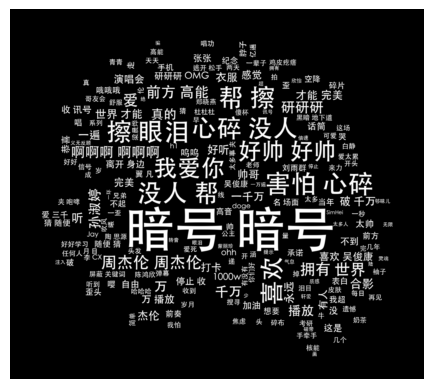

In [15]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/flower.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         color_func=lambda *args, **kwargs: "white",
                         width=800, height=400,
                         collocations=True,
                         scale = 1,
                         mask=pic
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

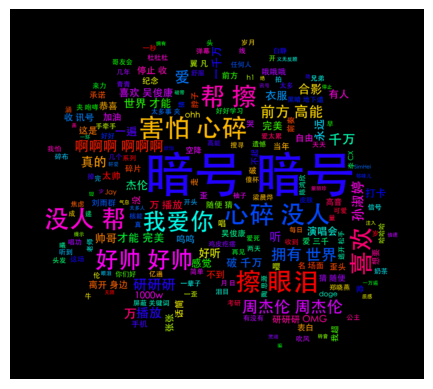

In [28]:
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image
import random

# 读取图片用于词云的掩码
pic = np.array(Image.open("img/converted_img/flower.png"))

# 读取用于生成词云的TXT文件
with open('text/anhao_dm.txt', 'r', encoding='UTF-8') as f:
    txt = f.read()

'''
定义一个用于生成随机颜色的函数，这个函数使用 HSL (Hue, Saturation, Lightness) 颜色空间，
色相（Hue）在 0 到 360 之间随机选择，饱和度（Saturation）和亮度（Lightness）固定为 100% 和 50%。
'''

def random_color_func(*args, **kwargs):
    hue = random.randint(0, 360)
    return f"hsl({hue}, 100%, 50%)"


# 生成词云
wd_0 = WordCloud(
    font_path='/System/Library/Fonts/STHeiti Medium.ttc',
    color_func=random_color_func,
    width=800, height=400,
    collocations=True,
    scale=1,
    mask=pic
).generate(txt)

# 词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🔗 WordCloud 参数讲解：collocations（词语组合搭配开关）

#### 📌 参数作用：
- `collocations=True`（默认）：启用**高频词语组合识别**（即双词搭配，bigram）
- `collocations=False`：只使用**单词频率**生成词云

#### 🧠 什么是 Collocation？
Collocations 是指在文本中**经常一起出现的词对**（而不是单个词），比如：
- “数据 可视化”
- “人工 智能”
- “社会 发展”

这些词对的出现频率远高于偶然组合的概率，是有意义的**语言搭配或短语**。

#### ✅ 设置说明：
- 开启 `collocations=True` 时，WordCloud 会自动检测高频词对
- 关闭该选项可避免词对“抢占”关键词空间
- 默认值为 True。
- 使用 generate_from_frequencies 时的行为
  - 如果使用 generate_from_frequencies 方法来生成词云，那么 collocations 参数会被忽略：
  - generate_from_frequencies 直接使用给定的词频字典生成词云，而不是从文本中提取词语和双词搭配，因此 collocations 参数在这种情况下没有影响。

#### 🎯 使用建议：
- 如果你希望在词云中突出“词语短语搭配”（如“经济 发展”），保留默认即可
- 如果你只关注单个词的统计表现，建议设为 `collocations=False`

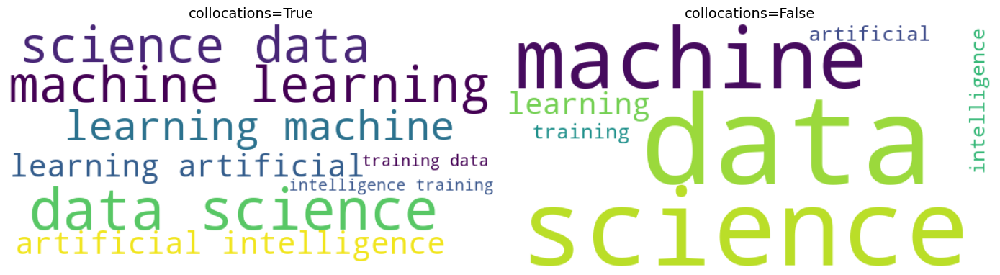

In [8]:
%matplotlib inline
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 示例英文原始文本（无需分词）
text = """
machine learning machine learning machine learning artificial intelligence training data data science data science data science data science
"""

# 创建 WordCloud 对象（启用词组识别）
wc_true = WordCloud(
    width=600,
    height=300,
    background_color="white",
    collocations=True,  # 默认值，识别词组搭配
    collocation_threshold=2,  # 默认是 30，调低可以强制识别
)
wc_true.generate(text)


# 创建 WordCloud 对象（禁用词组识别）
wc_false = WordCloud(
    width=600,
    height=300,
    background_color="white",
    collocations=False  # 不识别词组，全部拆词
)
wc_false.generate(text)

# 显示对比图
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(wc_true, interpolation="bilinear")
axes[0].set_title("collocations=True", fontsize=14)
axes[0].axis("off")

axes[1].imshow(wc_false, interpolation="bilinear")
axes[1].set_title("collocations=False", fontsize=14)
axes[1].axis("off")

plt.tight_layout()
plt.show()

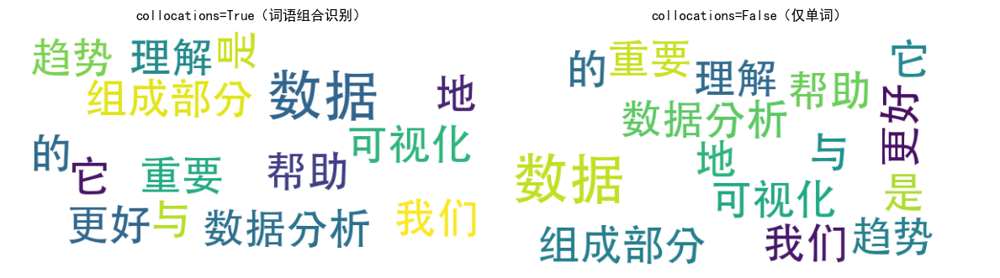

In [52]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

text = "数据可视化是数据分析的重要组成部分，它帮助我们更好地理解数据与趋势。"
words = " ".join(jieba.lcut(text))

# 开启词语搭配识别
wc_on = WordCloud(font_path="/System/Library/Fonts/STHeiti Medium.ttc", width=600, height=300,
                  background_color="white", collocations=True)
wc_on.generate(words)

# 关闭词语搭配识别
wc_off = WordCloud(font_path="/System/Library/Fonts/STHeiti Medium.ttc", width=600, height=300,
                   background_color="white", collocations=False)
wc_off.generate(words)

# 可视化对比
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(wc_on, interpolation="bilinear")
axes[0].set_title("collocations=True（词语组合识别）")
axes[0].axis("off")

axes[1].imshow(wc_off, interpolation="bilinear")
axes[1].set_title("collocations=False（仅单词）")
axes[1].axis("off")

plt.tight_layout()
plt.show()

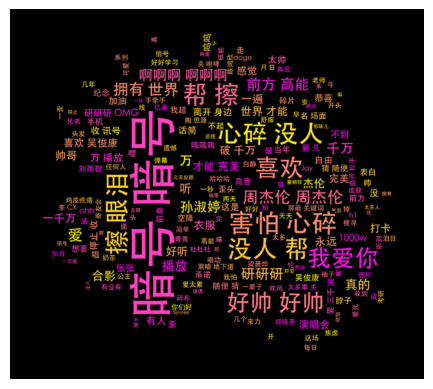

In [44]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/flower.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='spring',
                         width=800, height=400,
                         collocations=True,
                         scale = 1,
                         mask=pic
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🖼️ WordCloud 参数讲解：mask（遮罩/蒙版）

#### 📌 参数作用：
- `mask` 用于将词云图限制在一张**图形轮廓的范围内**。
- 它接受一个 **二维数组（numpy array）**，表示图像的灰度值。
- 白色（255）区域 → 不显示词，黑色（0）或深色区域 → 可填充词语。

#### 🎨 典型用途：
- 将词云绘制为：人脸轮廓、动物形状、LOGO、地图轮廓等创意图案
- 应用于节日海报、品牌设计、社交媒体传播等场景


#### 📥 如何获取遮罩图（mask）用于创意词云？


##### ✅ 1. 遮罩图的要求：

- **格式**：建议使用 `.png` 或 `.jpg`
- **颜色**：图案（黑/深色）在前景，背景为白色（255）
- **分辨率**：建议与词云画布一致，如 600x300 或 800x400

##### ✅ 2. 推荐素材网站（可免费下载遮罩图）：

| 网站名称         | 网址链接                            | 推荐搜索关键词         |
|------------------|--------------------------------------|------------------------|
| Iconfinder       | https://www.iconfinder.com           | `outline star`, `map`, `cloud`, `education` |
| CleanPNG         | https://www.cleanpng.com             | `silhouette`, `transparent shape`, `heart outline` |
| PNGWing（补充）  | https://www.pngwing.com              | `logo transparent`, `mask shape` |

##### ✅ 3. 使用方法：

1. 进入网站，搜索关键词（如 `star outline`, `map`, `heart`, `brain`）
2. 下载**背景透明或白底黑图**的图像
3. 使用 `PIL.Image.open()` 打开并转换为 `numpy array`
4. 将其传入 WordCloud 的 `mask` 参数


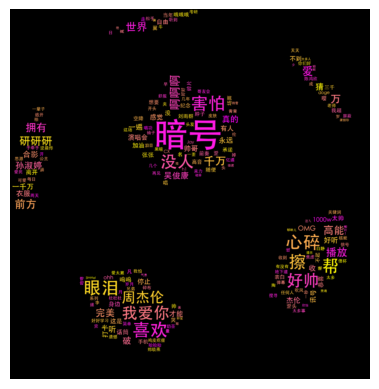

In [28]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/football.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='spring',
                         width=800, height=400,
                         collocations=False,
                         scale = 1,
                         mask=pic
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 轮廓宽度和颜色 contour_width、contour_color

- contour_width: float (default=0)
  - 定义：轮廓的宽度。
  - 默认值：0，表示不绘制轮廓。
  - 作用：当 mask 参数不为 None 且 contour_width 大于 0 时，会在词云图的边缘绘制一个轮廓。
  - 单位：轮廓宽度的单位是像素。
- contour_color: color value (default="black")
  - 定义：轮廓的颜色。
  - 默认值："black"（黑色）。
  - 作用：指定绘制轮廓的颜色。
  - 颜色值：可以是任何有效的颜色名称或十六进制颜色代码（如 #FF5733）。

**示例：**
>contour_width= 10.0,  
contour_color='blue',

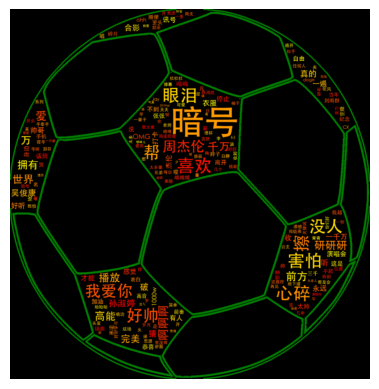

In [45]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/football.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='autumn',
                         width=800, height=400,
                         collocations=False,
                         scale = 1,
                         mask=pic,
                         contour_width= 5.0,
                         contour_color='green',
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

## 不常用参数

### 词云边界 margin

- margin: int (default=2)
  - 定义：词云内容与图像边缘之间的空白距离。
  - 默认值：2，表示有2像素的空白。
  - 作用：通过设置 margin，可以调整词云内容与图像边缘的距离，确保词云不会紧贴图像边缘，而是留有一定的空白空间。

- 示例：
  - 如果原始尺寸为800x400，设置margin = 20，
  - 则词云实际显示区域大小为：760x360

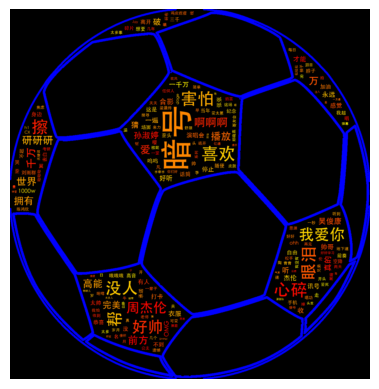

In [47]:
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

# 加载图像并转换为 nd-array
pic = np.array(Image.open("img/converted_img/football.png"))

# 读取用于生成词云的TXT文件
with open('text/anhao_dm.txt', 'r', encoding='UTF-8') as f:
    txt = f.read()

# 生成词云
wd_0 = WordCloud(
    font_path='/System/Library/Fonts/STHeiti Medium.ttc',
    colormap='autumn',
    width=800,
    height=400,
    collocations=False,
    scale=1,
    mask=pic,
    contour_width=10.0,
    contour_color='blue',
    margin=10  # 设置边界为20像素
).generate(txt)

# 词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 📏 WordCloud 参数讲解：prefer_horizontal（水平排布倾向）

#### 📌 参数含义：
- `prefer_horizontal` 控制词云中**词语横向显示的概率**
- 取值范围为 `0 ~ 1`，默认值为 `0.9`

#### 🧠 理解方式：
- 如果设置为 `1.0` → 所有词语都尽量横向排布
- 如果设置为 `0.0` → 所有词语都尽量竖向排布
- 中间值表示**混合布局**，水平词多一些

#### 🎯 使用建议：
| 场景                   | 推荐设置            |
|------------------------|---------------------|
| 正常阅读、美观         | `prefer_horizontal=0.9`（默认） |
| 海报创意、文字错落美感 | `prefer_horizontal=0.5` 或更低  |
| 排布结构强调（如中轴） | `prefer_horizontal=0.0`（全竖） |

> ❗ 注意：中文字体如果设置竖排比例太高，可能不易阅读，结合字体实际效果调整


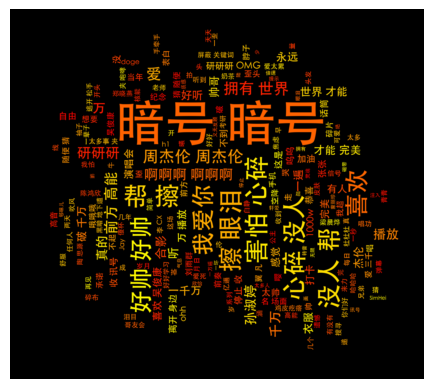

In [48]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/flower.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='autumn',
                         width=800, height=400,
                         collocations=True,
                         scale = 1,
                         mask=pic,
                         prefer_horizontal=0.3
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

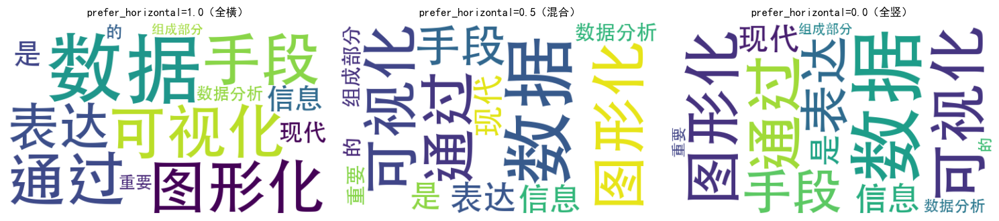

In [18]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

text = "数据可视化通过图形化手段表达数据信息，是现代数据分析的重要组成部分。"
words = " ".join(jieba.lcut(text))

# 三种排版比例词云：全横、半横、全竖
horiz_vals = [1.0, 0.5, 0.0]
titles = ["prefer_horizontal=1.0（全横）", "prefer_horizontal=0.5（混合）", "prefer_horizontal=0.0（全竖）"]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, h_val, title in zip(axes, horiz_vals, titles):
    wc = WordCloud(
        font_path="/System/Library/Fonts/STHeiti Medium.ttc",
        width=500,
        height=300,
        background_color="white",
        prefer_horizontal=h_val
    )
    wc.generate(words)
    ax.imshow(wc, interpolation="bilinear")
    ax.set_title(title, fontsize=12)
    ax.axis("off")

plt.tight_layout()
plt.show()

### 🔢 WordCloud 参数讲解：max_words（最大词数限制）

#### 📌 参数含义：
- `max_words` 控制**词云中最多显示多少个词**
- 默认值为 `200`，即词云最多显示 200 个词
- 排名靠前的高频词优先显示，超出则被舍弃

#### 🧠 使用场景说明：

| 应用目的             | 推荐 max_words 值 |
|----------------------|-------------------|
| 报告精要展示         | 20 ~ 50           |
| 内容集中高亮         | 80 ~ 100          |
| 词频分析可视化       | 200 ~ 300         |
| 详细文本内容挖掘     | 500+              |

> ❗ 注意：词语太多会导致字号变小、图像杂乱；词语太少可能表达不足

#### 🎯 使用建议：
- 根据遮罩大小/画布分辨率适当调整
- 可配合 `max_font_size` 保持视觉平衡

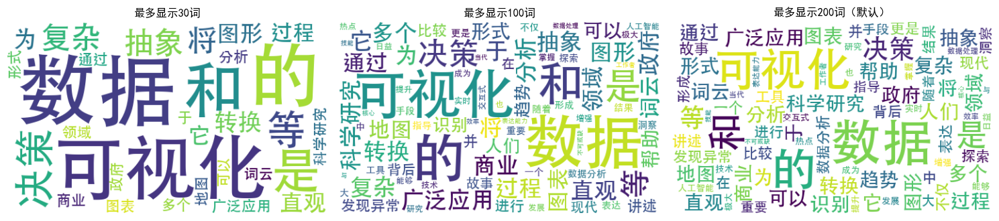

In [22]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

text = """
数据可视化是将抽象和复杂的数据转换为直观图形的过程，它广泛应用于商业分析、科学研究和政府决策等多个领域。
通过图表、地图、词云等形式，数据可视化可以帮助人们识别趋势、发现异常、进行比较并讲述数据背后的故事。
在现代数据分析中，数据可视化不仅是一个表达结果的工具，更是探索数据、形成洞察和指导决策的重要手段。
随着大数据和人工智能的发展，交互式可视化、实时可视化和增强可视化也日益成为研究热点。
掌握数据可视化技术，能够极大提升数据处理效率与表达能力，是当代数据工作者不可或缺的核心技能。
"""
words = " ".join(jieba.lcut(text))

# 3种不同词数设置
word_limits = [30, 100, 200]
titles = ["最多显示30词", "最多显示100词", "最多显示200词（默认）"]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, limit, title in zip(axes, word_limits, titles):
    wc = WordCloud(
        font_path="/System/Library/Fonts/STHeiti Medium.ttc",
        width=500,
        height=300,
        background_color="white",
        max_words=limit
    )
    wc.generate(words)
    ax.imshow(wc, interpolation="bilinear")
    ax.set_title(title, fontsize=12)
    ax.axis("off")

plt.tight_layout()
plt.show()


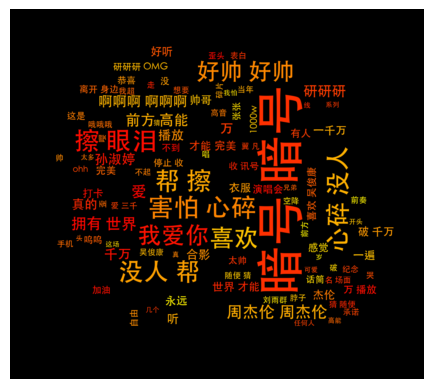

In [49]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/flower.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='autumn',
                         width=800, height=400,
                         collocations=True,
                         scale = 1,
                         mask=pic,
                         max_words = 100
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🔠 WordCloud 参数讲解：min_font_size 与 max_font_size

#### 📌 参数作用：
- `min_font_size`：词云中出现词语的**最小字号**，int (default=4)
- `max_font_size`：**最大字号**（⚠️ 在默认布局中一般不生效，使用 `relative_scaling=0` 才有效）

####  🧠 理解方式：
- 字体大小通常与词频（或权重）成正比
- 若最小字体太小 → 低频词难以阅读
- 若最大字体受限 → 高频词无法突出视觉

#### 🎯 使用建议：

| 场景                     | 设置建议                        |
|--------------------------|----------------------------------|
| 让所有词更清晰可读       | 增大 `min_font_size`（如 15~20） |
| 控制高频词不太大         | 限制 `max_font_size`             |
| 默认自动缩放适配画布     | 保持默认即可                     |

> 注意：`max_font_size` 在 `relative_scaling > 0` 时系统自动缩放，手动值不生效


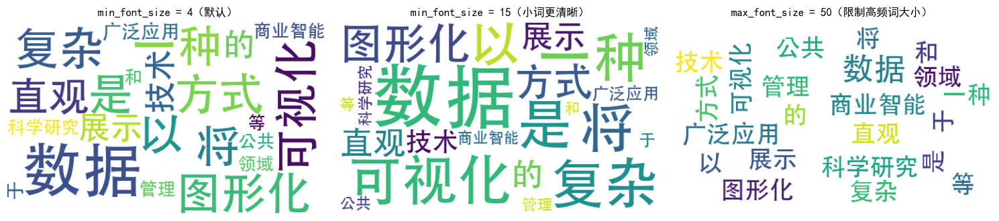

In [25]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

text = """
数据可视化是一种将复杂数据以图形化方式直观展示的技术，广泛应用于商业智能、科学研究和公共管理等领域。
"""

words = " ".join(jieba.lcut(text))

# 三种字体大小设置
settings = [
    {"min_font_size": 4, "max_font_size": None, "title": "min_font_size = 4（默认）"},
    {"min_font_size": 15, "max_font_size": None, "title": "min_font_size = 15（小词更清晰）"},
    {"min_font_size": 10, "max_font_size": 50, "title": "max_font_size = 50（限制高频词大小）"}
]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, cfg in zip(axes, settings):
    wc = WordCloud(
        font_path='/System/Library/Fonts/STHeiti Medium.ttc',
        width=500,
        height=300,
        background_color="white",
        min_font_size=cfg["min_font_size"],
        max_font_size=cfg.get("max_font_size", None)
    )
    wc.generate(words)
    ax.imshow(wc, interpolation="bilinear")
    ax.set_title(cfg["title"], fontsize=12)
    ax.axis("off")

plt.tight_layout()
plt.show()

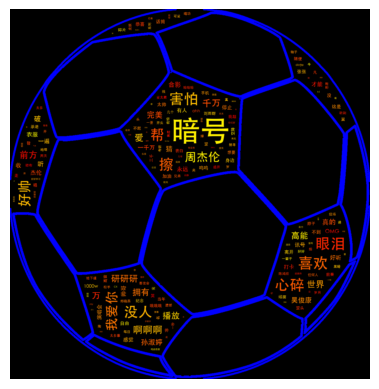

In [80]:
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

# 加载图像并转换为 nd-array
pic = np.array(Image.open("img/converted_img/football.png"))

# 读取用于生成词云的TXT文件
with open('text/anhao_dm.txt', 'r', encoding='UTF-8') as f:
    txt = f.read()

# 生成词云
wd_0 = WordCloud(
    font_path='/System/Library/Fonts/STHeiti Medium.ttc',
    colormap='autumn',
    max_words=200,  # 默认设置，最多显示200个单词
    min_font_size=5,  # 设置最小字体大小
    max_font_size=100,  # 设置最大字体大小
    width=800,
    height=400,
    collocations=False,
    scale=1,
    mask=pic,
    contour_width=10.0,
    contour_color='blue',
    margin=20
).generate(txt)

# 词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🔡 WordCloud 参数讲解：font_step（字体大小步长）

#### 📌 参数作用：
- 控制词云中文字的**字号间隔**
- 默认值为 `1`，即字体大小可以按像素逐级变化
- 值越大，字号级别越粗，词云中词语字体的“层级感”越明显

#### 🎯 使用效果：

| font_step 值   | 效果说明                        |
|----------------|---------------------------------|
| 1（默认）      | 字号连续变化，平滑渐进           |
| 4~6            | 字体级别感增强，显得更有“层次感” |
| >10            | 字体分布变粗略，可能会不均衡     |

> 适合与 `max_words` 一起使用：词数多时步长小，词数少时步长大


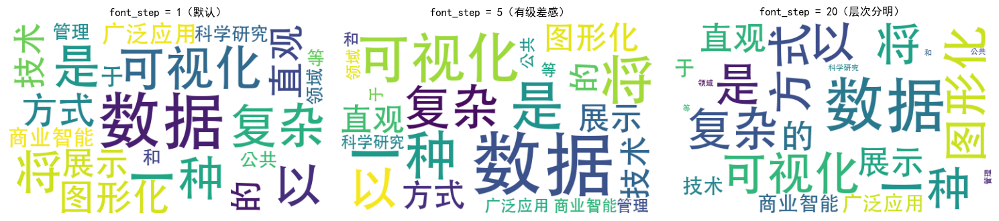

In [27]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

text = """
数据可视化是一种将复杂数据以图形化方式直观展示的技术，广泛应用于商业智能、科学研究和公共管理等领域。
"""

words = " ".join(jieba.lcut(text))

# 设置不同字体步长值
steps = [1, 5, 20]
titles = ["font_step = 1（默认）", "font_step = 5（有级差感）", "font_step = 20（层次分明）"]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, step, title in zip(axes, steps, titles):
    wc = WordCloud(
        font_path='/System/Library/Fonts/STHeiti Medium.ttc',
        width=500,
        height=300,
        background_color="white",
        font_step=step,
        max_words=100
    )
    wc.generate(words)
    ax.imshow(wc, interpolation="bilinear")
    ax.set_title(title, fontsize=12)
    ax.axis("off")

plt.tight_layout()
plt.show()

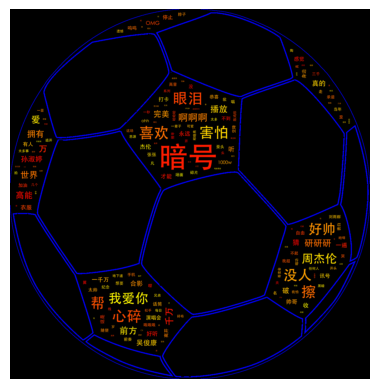

In [81]:
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

# 加载图像并转换为 nd-array
pic = np.array(Image.open("img/converted_img/football.png"))

# 读取用于生成词云的TXT文件
with open('text/anhao_dm.txt', 'r', encoding='UTF-8') as f:
    txt = f.read()

# 生成词云
wd_0 = WordCloud(
    font_path='/System/Library/Fonts/STHeiti Medium.ttc',
    colormap='autumn',
    max_words=200,  # 默认设置，最多显示200个单词
    min_font_size=5,  # 设置最小字体大小
    max_font_size=100,  # 设置最大字体大小
    font_step=6,  # 默认字体步长
    width=800,
    height=400,
    collocations=False,
    scale=4,
    mask=pic,
    contour_width=10.0,
    contour_color='blue',
    margin=20
).generate(txt)

# 词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🧹 WordCloud 参数讲解：stopwords（停用词 / 屏蔽词）

#### 📌 参数作用：
- `stopwords` 用于指定**不想在词云中显示的词语集合**
- 可以是 Python 集合 `set()` 或列表 `[]`
- WordCloud 会在生成前过滤掉这些词，不参与词频统计

#### 🧠 停用词的常见用途：

| 类型              | 示例词                            |
|-------------------|------------------------------------|
| 无实际含义的虚词   | “的”、“了”、“是”、“有”           |
| 功能性词（结构性） | “我们”、“这个”、“他们”、“它的”     |
| 已知不想展示的词   | “数据”、“可视化”（若你只关注细节） |

#### ✅ 使用方法：
- stopwords = None（默认值）：
- 使用内置的 STOPWORDS 列表，该列表包含常见的英文停用词（如 "the", "and", "is" 等）。
- 自定义 stopwords：
    - 用户可以提供一个包含自定义停用词的集合，以排除特定的单词。
    - 例如，可以排除特定的品牌名称或主题词。
```python
wc = WordCloud(stopwords={"的", "了", "是"})



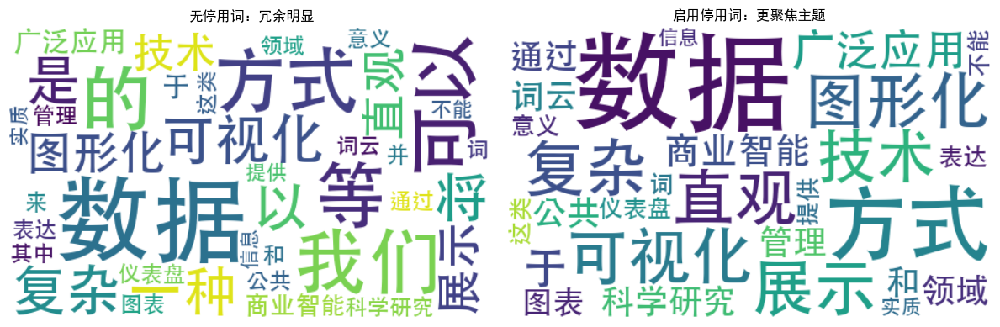

In [18]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

text = """
数据可视化是一种将复杂数据以图形化方式直观展示的技术，广泛应用于商业智能、科学研究和公共管理等领域。
我们可以通过词云、图表、仪表盘等方式来表达数据意义，其中的“数据”、“我们”、“可以”这类词并不能提供实质信息。
"""

words = " ".join(jieba.lcut(text))

# 停用词设置
my_stopwords = {"的", "我们", "可以", "是", "一种", "其中", "来", "以","将", "并","等"}

# 不使用停用词
wc1 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc', width=500, height=300, background_color="white")
wc1.generate(words)

# 使用停用词
wc2 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc', width=500, height=300, background_color="white",
                stopwords=my_stopwords)
wc2.generate(words)

# 显示对比图
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(wc1, interpolation="bilinear")
axes[0].set_title("无停用词：冗余明显")
axes[0].axis("off")

axes[1].imshow(wc2, interpolation="bilinear")
axes[1].set_title("启用停用词：更聚焦主题")
axes[1].axis("off")

plt.tight_layout()
plt.show()


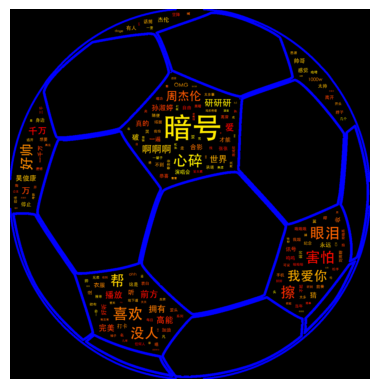

In [39]:
#示例1：使用内置的停用词列表
import numpy as np
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from PIL import Image

# 加载图像并转换为 nd-array
pic = np.array(Image.open("img/converted_img/football.png"))

# 读取用于生成词云的TXT文件
with open('text/anhao_dm.txt', 'r', encoding='UTF-8') as f:
    txt = f.read()

# 生成词云
wd_0 = WordCloud(
    font_path='/System/Library/Fonts/STHeiti Medium.ttc',
    colormap='autumn',
    max_words=200,  # 默认设置，最多显示200个单词
    min_font_size=5,  # 设置最小字体大小
    max_font_size=100,  # 设置最大字体大小
    font_step=1,  # 默认字体步长
    stopwords=STOPWORDS,  # 使用内置的停用词列表
    width=800,
    height=400,
    collocations=False,
    scale=1,
    mask=pic,
    contour_width=10.0,
    contour_color='blue',
    margin=20
).generate(txt)

# 词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

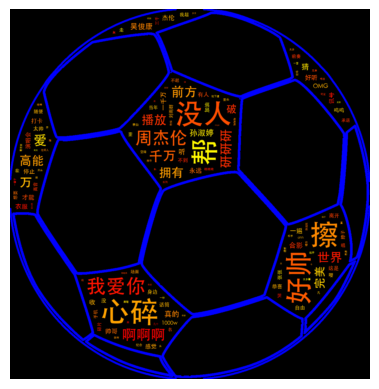

In [41]:
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

# 加载图像并转换为 nd-array
pic = np.array(Image.open("img/converted_img/football.png"))

# 读取用于生成词云的TXT文件
with open('text/anhao_dm.txt', 'r', encoding='UTF-8') as f:
    txt = f.read()

# 自定义停用词列表
custom_stopwords = {"暗号", "喜欢", "害怕", "眼泪"}

# 生成词云
wd_0 = WordCloud(
    font_path='/System/Library/Fonts/STHeiti Medium.ttc',
    colormap='autumn',
    max_words=200,  # 默认设置，最多显示200个单词
    min_font_size=5,  # 设置最小字体大小
    max_font_size=100,  # 设置最大字体大小
    font_step=1,  # 默认字体步长
    stopwords=custom_stopwords,  # 使用自定义停用词列表
    width=800,
    height=400,
    collocations=False,
    scale=1,
    mask=pic,
    contour_width=10.0,
    contour_color='blue',
    margin=20
).generate(txt)

# 词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🖼️ WordCloud 参数讲解：background_color（背景颜色）

#### 📌 参数作用：
- 控制词云图的**背景颜色**
- 默认值为 `"black"`（黑色）
- 支持所有 HTML/CSS 标准颜色名（如 `"white"`, `"blue"`, `"lightgray"`），也支持 RGB 十六进制颜色（如 `"#f0f0f0"`）

#### 🧠 应用场景举例：

| 背景颜色     | 场景用途                            |
|--------------|-------------------------------------|
| `white`      | 正常展示、印刷文档、PPT 投影         |
| `black`      | 夜间风格、社交媒体、对比度强的视觉海报 |
| `#fef9e7`    | 柔和纸感，用于教育类或复古风设计       |
| `transparent`（透明） | 导出 PNG 后叠加在其他图层上使用       |

> ❗ 若你想导出透明背景词云图，需要使用 `mode="RGBA"` 并设置 `background_color=None`


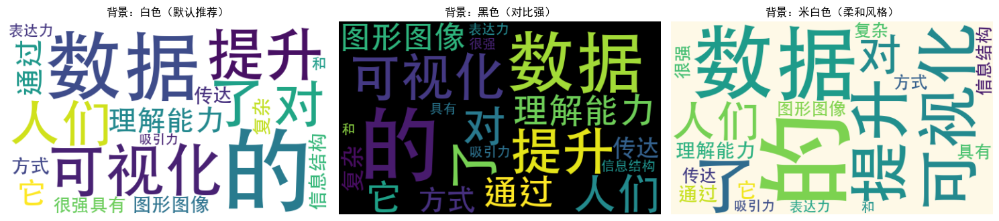

In [22]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

# Option 1: Use a system CJK font directly
plt.rcParams['font.sans-serif'] = ['SimHei', 'Arial Unicode MS', 'Heiti TC', 'WenQuanYi Micro Hei', 'Noto Sans CJK SC']

text = "数据可视化提升了人们对数据的理解能力，它通过图形图像方式传达复杂的信息结构，具有很强的表达力和吸引力。"
words = " ".join(jieba.lcut(text))

# 三种背景颜色对比
colors = ["white", "black", "#fef9e7"]
titles = ["背景：白色（默认推荐）", "背景：黑色（对比强）", "背景：米白色（柔和风格）"]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, bg_color, title in zip(axes, colors, titles):
    wc = WordCloud(
        font_path="/System/Library/Fonts/STHeiti Medium.ttc",
        background_color=bg_color,
        width=500,
        height=300
    )
    wc.generate(words)
    ax.imshow(wc, interpolation="bilinear")
    ax.set_title(title, fontsize=12)
    ax.axis("off")

plt.tight_layout()
plt.show()

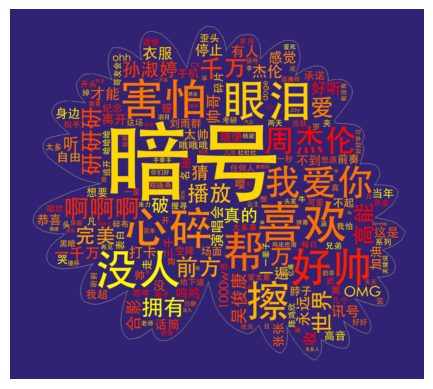

In [24]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/flower.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='autumn',
                         width=800, height=400,
                         collocations=False,
                         scale = 1,
                         mask=pic,
                         contour_width= 1.0,
                         contour_color='grey',
                         background_color='#312273'
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🌈 WordCloud 参数讲解：mode（图像色彩模式）

#### 📌 参数作用：
- 控制词云生成图像的**颜色通道模式**
- 常用值包括：
  - `"RGB"`：默认，适合彩色背景，不支持透明（背景必须设置为具体颜色）
  - `"RGBA"`：支持透明通道，可与 `background_color=None` 配合实现 **透明背景词云**

#### 🎯 使用场景：

| mode 值    | 搭配背景色设置         | 适合用途                      |
|------------|-------------------------|-------------------------------|
| `"RGB"`    | `background_color="white"` | 普通词云生成与展示             |
| `"RGBA"`   | `background_color=None`    | 导出透明背景 PNG，用于网页图层或 PPT 叠加 |

> ❗ 注意：`mode="RGBA"` 时必须设置 `background_color=None`，否则透明通道不会生效。


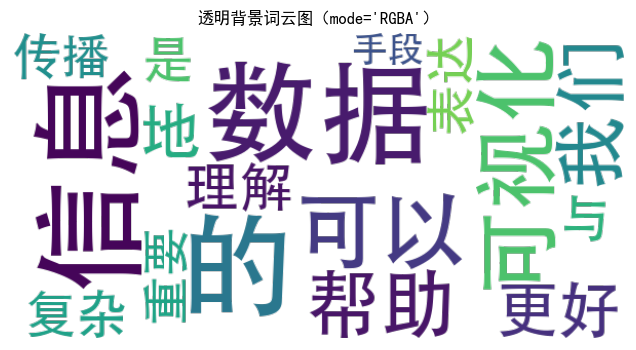

In [19]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

text = "数据可视化可以帮助我们更好地理解复杂的信息，是信息表达与数据传播的重要手段。"
words = " ".join(jieba.lcut(text))

# 创建支持透明背景的词云对象
wc = WordCloud(
    font_path="/System/Library/Fonts/STHeiti Medium.ttc",
    mode="RGBA",                  # 启用 Alpha 通道
    background_color=None,        # 设置为透明
    width=600,
    height=300
)
wc.generate(words)

# 显示词云图
plt.figure(figsize=(8, 4))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("透明背景词云图（mode='RGBA'）")
plt.show()

# 保存为透明 PNG 图像
wc.to_file("img/transparent_wordcloud.png")

### 🔁 WordCloud 参数讲解：repeat（少词时重复填充）

#### 📌 参数作用：
- 控制词云图中词语是否**重复出现**来填满图像
- 默认值为 `False`：词云中每个词语只显示一次（按词频确定字体大小）
- 设置为 `True`：当词语数量较少或遮罩图形太大时，会自动重复出现高频词以填充画布

#### 🎯 适用场景：

| 应用场景               | 是否推荐使用 `repeat=True` |
|------------------------|----------------------------|
| 关键词少但图形大         | ✅ 是                     |
| 精确表达含义/不重复词   | ❌ 否（保持唯一性）        |
| 做装饰型或主题型词云     | ✅ 是                     |

> ❗ 注意：启用 `repeat=True` 后，词语会反复使用，但不会改变原本的权重大小。


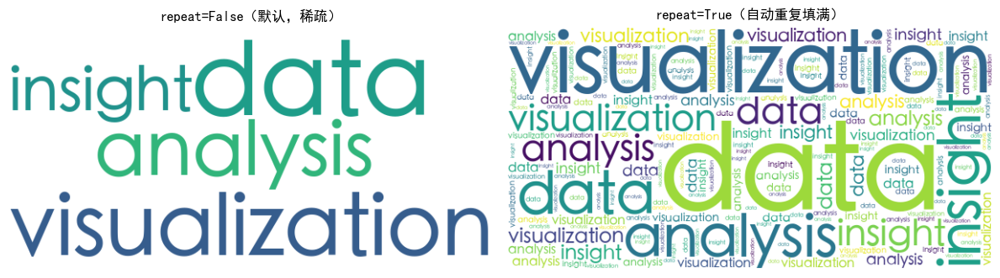

In [39]:
%matplotlib inline
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 少量英文关键词 + 词频
text = "data visualization analysis insight"

# 设置字体路径（macOS 用户默认字体）
font_path = "/System/Library/Fonts/STHeiti Medium.ttc"

# repeat=False（默认）
wc_false = WordCloud(font_path=font_path, width=600, height=300, background_color="white", repeat=False)
wc_false.generate(text)

# repeat=True
wc_true = WordCloud(font_path=font_path, width=600, height=300, background_color="white", repeat=True)
wc_true.generate(text)

# 对比显示
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(wc_false, interpolation="bilinear")
axes[0].set_title("repeat=False（默认，稀疏）")
axes[0].axis("off")

axes[1].imshow(wc_true, interpolation="bilinear")
axes[1].set_title("repeat=True（自动重复填满）")
axes[1].axis("off")

plt.tight_layout()
plt.show()

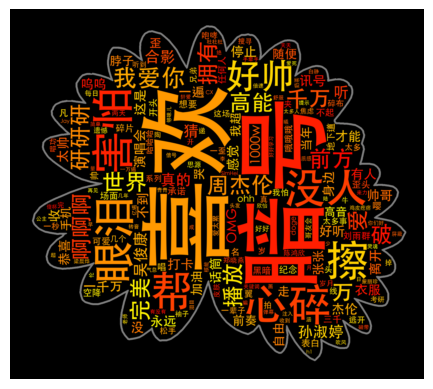

In [28]:
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# 加载图像并转换为灰度图像
pic = Image.open("img/converted_img/flower.png").convert('L')
pic = np.array(pic)

# 读取用于生成词云的文本
with open('text/anhao_dm.txt', 'r', encoding='UTF-8') as f:
    txt = f.read()

# 生成词云
wd_0 = WordCloud(
    font_path='/System/Library/Fonts/STHeiti Medium.ttc',
    colormap='autumn',
    width=800,
    height=400,
    collocations=False,
    scale=1,
    mask=pic,
    contour_width=10.0,
    contour_color='grey',
    repeat=True  # 设置重复单词和短语
).generate(txt)

# 词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 📏 WordCloud 参数讲解：min_word_length（最小词语长度）

#### 📌 参数作用：
- 控制词云中词语的**最小长度**
- 单词长度小于该值的词将被自动过滤，不参与绘制

#### 🎯 使用场景：

| 应用场景                      | 推荐设置         |
|-------------------------------|------------------|
| 英文词云中过滤如 "a", "of"     | `min_word_length=2` 或 `3` |
| 中文词云中过滤无意义短词（如“一”、“是”、“有”） | `min_word_length=2` |
| 保留所有短词                  | 不设置或设为 `1` |

> 注意：中文分词后每个“词”通常为两个及以上汉字，因此 `min_word_length=2` 是中文推荐起点


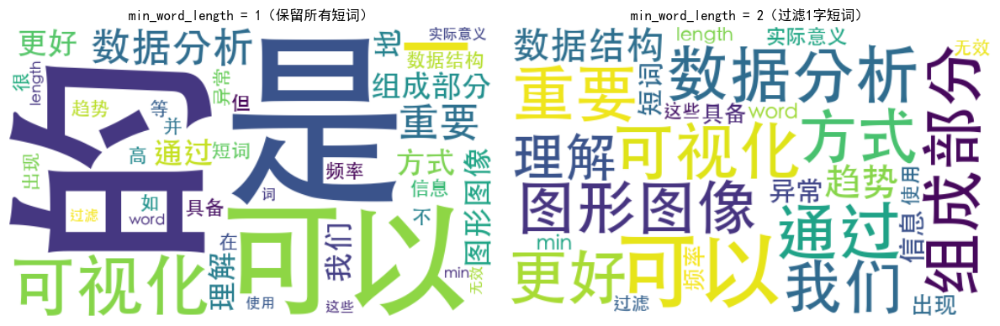

In [41]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import jieba

text = """
可视化是数据分析的重要组成部分。通过图形图像的方式，我们可以更好地理解数据结构、趋势、异常等信息。
短词如“的”、“是”、“在”出现频率很高，但并不具备实际意义。使用 min_word_length 可以过滤这些无效词。
"""

words = " ".join(jieba.lcut(text))

font_path = "/System/Library/Fonts/STHeiti Medium.ttc"

# 不过滤短词
wc1 = WordCloud(font_path=font_path, width=500, height=300, background_color="white", min_word_length=1)
wc1.generate(words)

# 过滤长度小于 2 的词
wc2 = WordCloud(font_path=font_path, width=500, height=300, background_color="white", min_word_length=2)
wc2.generate(words)

# 显示对比图
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(wc1, interpolation="bilinear")
axes[0].set_title("min_word_length = 1（保留所有短词）")
axes[0].axis("off")

axes[1].imshow(wc2, interpolation="bilinear")
axes[1].set_title("min_word_length = 2（过滤1字短词）")
axes[1].axis("off")

plt.tight_layout()
plt.show()


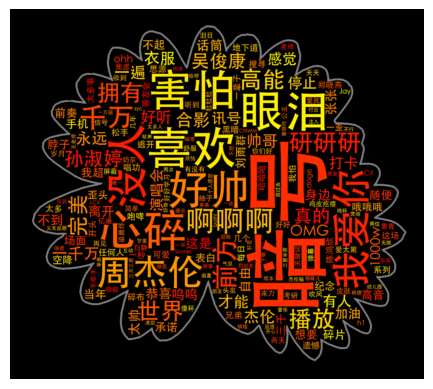

In [156]:
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# 加载图像并转换为灰度图像
pic = Image.open("img/converted_img/flower.png").convert('L')
pic = np.array(pic)

# 读取用于生成词云的文本
with open('text/anhao_dm.txt', 'r', encoding='UTF-8') as f:
    txt = f.read()

# 生成词云
wd_0 = WordCloud(
    font_path='/System/Library/Fonts/STHeiti Medium.ttc',
    colormap='autumn',
    width=800,
    height=400,
    collocations=False,
    scale=1,
    mask=pic,
    contour_width=10.0,
    contour_color='grey',
    min_word_length=2  # 设置单词必须包含的最少字母数
).generate(txt)

# 词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🔢 WordCloud 参数讲解：include_numbers（是否包含数字）

#### 📌 参数作用：
- 控制词云中是否**保留纯数字词语**
- 默认值为 `True`（保留数字词）
- 设置为 `False` 时会过滤如 “2024”、“100”、“12345” 等纯数字

#### 🧠 场景说明：

| 应用场景                             | 是否保留数字？（推荐设置） |
|--------------------------------------|-----------------------------|
| 年度分析词云（如“2020”、“2021”）     | ✅ 是 `include_numbers=True` |
| 产品描述或评论词云（如“99元”、“5星”） | ✅ 是 `True`（数字有含义）   |
| 文学文本、哲学文本、抽象语义分析     | ❌ 否 `include_numbers=False` |

> 注意：该参数只影响“完全是数字的词”，如“2023”；不影响含字母/符号的词，如“v2.0”。


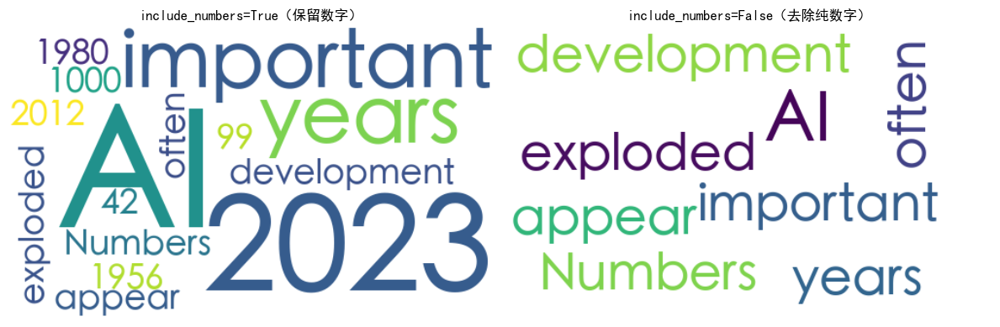

In [31]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

text = "The most important years in AI development are 1956, 1980, 2012, and 2023. In 2023, AI exploded. Numbers like 1000, 99, and 42 appear often."

# 字体路径（英文字体默认可用，不设也行）
font_path = "/System/Library/Fonts/STHeiti Medium.ttc"

# 包含数字
wc_include = WordCloud(font_path=font_path, width=500, height=300, background_color="white",
                       include_numbers=True)
wc_include.generate(text)

# 不包含数字
wc_exclude = WordCloud(font_path=font_path, width=500, height=300, background_color="white",
                       include_numbers=False)
wc_exclude.generate(text)

# 显示对比
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(wc_include, interpolation="bilinear")
axes[0].set_title("include_numbers=True（保留数字）")
axes[0].axis("off")

axes[1].imshow(wc_exclude, interpolation="bilinear")
axes[1].set_title("include_numbers=False（去除纯数字）")
axes[1].axis("off")

plt.tight_layout()
plt.show()


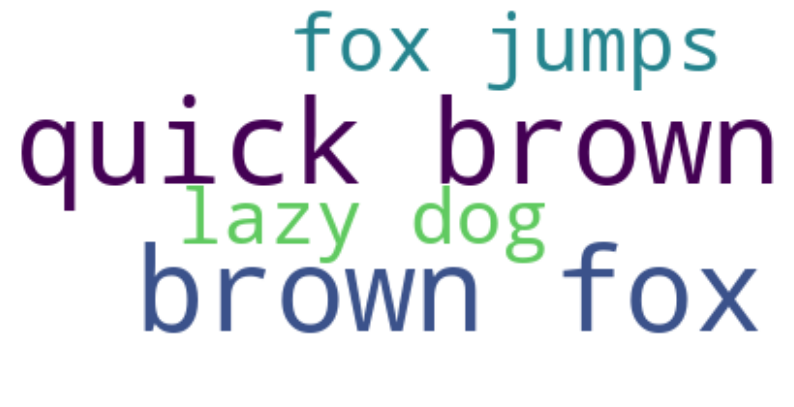

In [158]:
from wordcloud import WordCloud
import numpy as np
import matplotlib.pyplot as plt

# 创建一些示例文本
text = "The quick brown fox jumps over the lazy dog. 1 2 3 4 5 6 7 8 9 0 " * 100

# 创建 WordCloud 对象并包含数字
wordcloud = WordCloud(max_words=200, background_color="white", include_numbers=False).generate(text)

# 显示词云
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

### 🔍 WordCloud 参数讲解：regexp（自定义正则表达式切词规则）

#### 📌 参数作用：
- 替代默认的空格分词方式，通过**正则表达式模式**来手动定义“词语”的划分方式
- 特别适用于：
  - 特殊格式文本（如 ID_01、标签组、带符号标注）
  - 非空格分隔的英文/数字组合
  - 不使用 jieba 的非中文场景

#### 🧠 常见正则写法：

| 正则表达式       | 匹配内容说明                    |
|------------------|---------------------------------|
| `\\w+`           | 匹配所有单词（字母数字下划线）     |
| `[a-zA-Z]+`      | 只匹配纯英文单词                 |
| `\\d+`           | 匹配数字                         |
| `[^,\\s]+`       | 用逗号或空格分隔的关键词列表     |
| `[\\u4e00-\\u9fa5]{2,}` | 匹配长度 ≥ 2 的中文词        |

#### 🎯 使用建议：

- 英文/标签类文本：使用 `regexp=r"\\w+"`
- 中文推荐使用 `jieba` 分词，不建议使用 regexp
- 自定义分隔符文本（如标签串 "数据,可视化,图形"）非常适合用 regexp

> ⚠️ 注意：一旦使用 `regexp`，将**忽略 `jieba` 分词或默认空格切词**


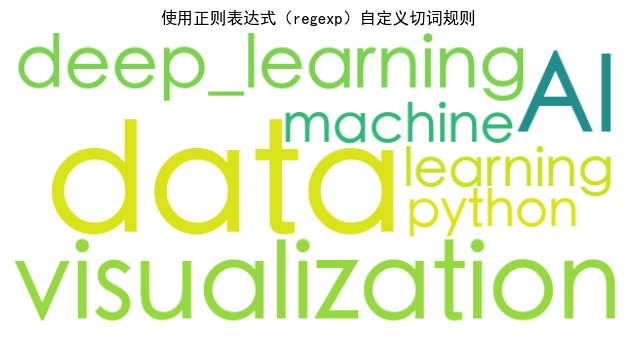

In [45]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 示例标签文本（无空格，用逗号分隔）
text = "data,visualization,2023,AI,deep_learning,machine,learning,python,100,90"

# 使用正则表达式切词：非空格或逗号的字符序列
regexp_pattern = r"[^,\s]+"

wc = WordCloud(
    font_path="/System/Library/Fonts/STHeiti Medium.ttc",
    width=600,
    height=300,
    background_color="white",
    regexp=regexp_pattern
)

wc.generate(text)

plt.figure(figsize=(8, 4))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("使用正则表达式（regexp）自定义切词规则")
plt.show()


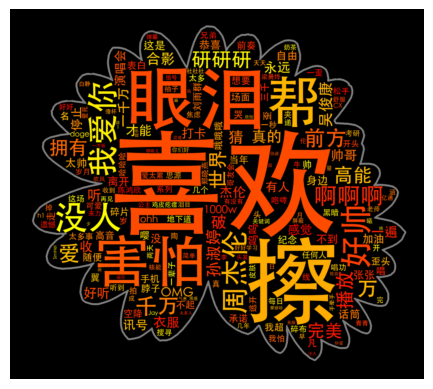

In [43]:
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# 加载图像并转换为灰度图像
pic = Image.open("img/converted_img/flower.png").convert('L')
pic = np.array(pic)

# 读取用于生成词云的文本
with open('text/anhao_dm.txt', 'r', encoding='UTF-8') as f:
    txt = f.read()

# 正则表达式：匹配所有单词，除“心碎”“暗号’外
regexp = r'\b(?!心碎\b)(?!暗号\b)[\w\']+\b'

# 生成词云
wd_0 = WordCloud(
    font_path='/System/Library/Fonts/STHeiti Medium.ttc',
    colormap='autumn',
    width=800,
    height=400,
    collocations=False,
    scale=1,
    mask=pic,
    contour_width=10.0,
    contour_color='grey',
    regexp=regexp  # 设置用于拆分文本的正则表达式
).generate(txt)

# 词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🔗 WordCloud 参数讲解：collocation_threshold（词组最低出现次数）

#### 📌 参数作用：
- 控制 WordCloud 在启用 `collocations=True` 时，哪些**词语组合（bigrams）**可以作为搭配词被纳入词云
- 设置的数值表示：词组必须至少出现 N 次，才会被识别为搭配词纳入词云
- 默认值为 `30`

#### 🧠 场景说明：

| 应用场景                                | 推荐设置                   |
|-----------------------------------------|----------------------------|
| 原始英文文章、报告等，词组较稀疏         | ❗ 建议调低，如 `5` 或 `10` |
| 高频短语重复多次（如问卷短语、广告语）   | 默认或略高（20~50）        |
| 保守型词云（只保留频繁搭配）             | 保持默认 `30`              |

> ⚠️ 注意：该参数**只对英文/非分词文本**启用，**对中文使用 jieba 分词时无效**


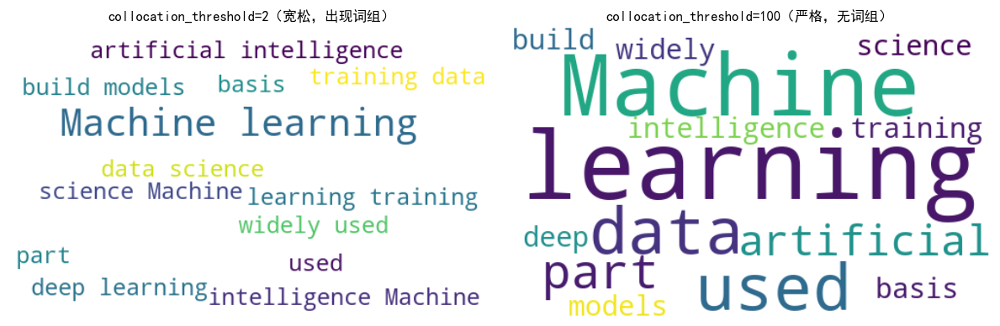

In [46]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

text = """
Machine learning is part of artificial intelligence. Machine learning is widely used in data science.
Machine learning is also the basis of deep learning. In machine learning, training data is used to build models.
"""

# 低阈值：更容易识别短语
wc_low = WordCloud(width=500, height=300, background_color="white",
                   collocations=True, collocation_threshold=2)
wc_low.generate(text)

# 高阈值：限制词组识别（默认 30 → 我们用夸张的值模拟）
wc_high = WordCloud(width=500, height=300, background_color="white",
                    collocations=True, collocation_threshold=100)
wc_high.generate(text)

# 展示
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(wc_low, interpolation="bilinear")
axes[0].set_title("collocation_threshold=2（宽松，出现词组）")
axes[0].axis("off")

axes[1].imshow(wc_high, interpolation="bilinear")
axes[1].set_title("collocation_threshold=100（严格，无词组）")
axes[1].axis("off")

plt.tight_layout()
plt.show()


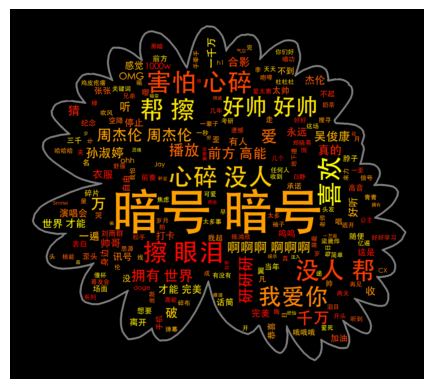

In [2]:
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# 加载图像并转换为灰度图像
pic = Image.open("img/converted_img/flower.png").convert('L')
pic = np.array(pic)

# 读取用于生成词云的文本
with open('text/anhao_dm.txt', 'r', encoding='UTF-8') as f:
    txt = f.read()

# 生成词云
wd_0 = WordCloud(
    font_path='/System/Library/Fonts/STHeiti Medium.ttc',
    colormap='autumn',
    width=800,
    height=400,
    collocations=True,  # 启用二元语法识别
    collocation_threshold=60,  
    scale=1,
    mask=pic,
    contour_width=10.0,
    contour_color='grey',
).generate(txt)

# 词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🔤 WordCloud 参数讲解：normalize_plurals（复数还原为单数）

#### 📌 参数作用：
- 控制 WordCloud 是否将英文复数词还原为对应的单数词
- 默认值为 `True`（会将如 "words" → "word"、"cars" → "car"）
- 设为 `False` 时，"word" 和 "words" 将被视为两个不同的词，分别计算词频

#### 🎯 使用效果说明：

| 参数设置                  | 效果                       |
|---------------------------|----------------------------|
| `normalize_plurals=True`  | “cars”和“car”会归一为“car” |
| `normalize_plurals=False` | “car”和“cars”分开统计展示  |

> ⚠️ 注意：此参数只对英文词云有效，不影响中文


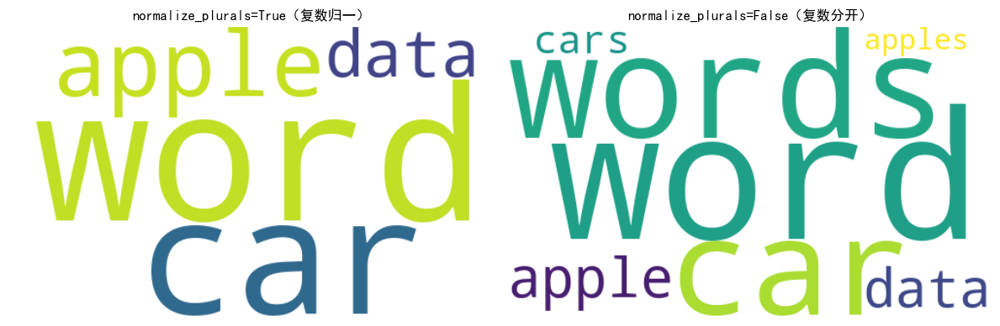

In [48]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 示例英文文本（包含复数和单数混合）
text = "word words word words car cars car apple apples apple data data"

# normalize_plurals=True（默认）
wc_true = WordCloud(width=500, height=300, background_color="white", normalize_plurals=True)
wc_true.generate(text)

# normalize_plurals=False
wc_false = WordCloud(width=500, height=300, background_color="white", normalize_plurals=False)
wc_false.generate(text)

# 显示对比图
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(wc_true, interpolation="bilinear")
axes[0].set_title("normalize_plurals=True（复数归一）")
axes[0].axis("off")

axes[1].imshow(wc_false, interpolation="bilinear")
axes[1].set_title("normalize_plurals=False（复数分开）")
axes[1].axis("off")

plt.tight_layout()
plt.show()

### ⚖️ WordCloud 参数讲解：relative_scaling（词频与字体大小的相对关系）

#### 📌 参数作用：
- 控制词语**频率与字体大小的关系强弱**
- 取值范围：0 到 1（默认是 `0.5`）

#### 🎯 参数效果：

| 设置值               | 效果描述                                        |
|----------------------|-------------------------------------------------|
| `relative_scaling = 1` | 字体大小严格与词频成正比，频率差异越大，字体差异越明显 |
| `relative_scaling = 0` | 所有词使用近似字体大小，仅依赖 `max_font_size`，强调均衡 |
| `relative_scaling = 0.5` | 默认值，平衡频率权重与美观度                     |

> ✅ 该参数适用于英文或词频字典输入，不影响中文分词方式


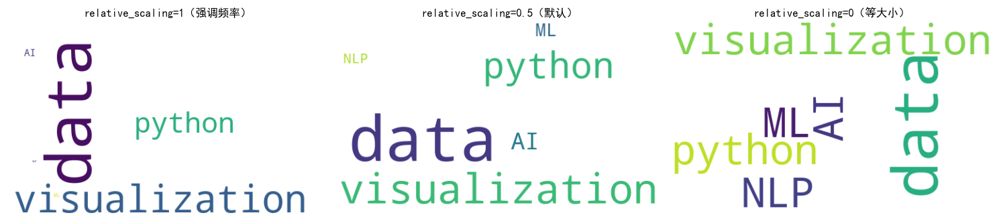

In [49]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 构造一个人工词频字典（突出 frequency 差异）
frequencies = {
    "data": 100,
    "visualization": 80,
    "python": 60,
    "AI": 20,
    "ML": 10,
    "NLP": 5
}

# 三种 scaling 方式对比
scalings = [1.0, 0.5, 0.0]
titles = ["relative_scaling=1（强调频率）", "relative_scaling=0.5（默认）", "relative_scaling=0（等大小）"]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, s, title in zip(axes, scalings, titles):
    wc = WordCloud(width=500, height=300, background_color="white", relative_scaling=s)
    wc.generate_from_frequencies(frequencies)
    ax.imshow(wc, interpolation="bilinear")
    ax.set_title(title, fontsize=12)
    ax.axis("off")

plt.tight_layout()
plt.show()


### 🏷️ WordCloud 参数讲解：ranks_only（仅根据排名分级字体）

#### 📌 参数作用：
- 控制词云中词语字体大小是否**只依据排名**而不是实际频率
- 默认值为 `False`（字体大小 ∝ 词频大小）
- 设置为 `True` 时，系统只按照词频排名来分配字号，**忽略词频间具体倍数差异**

#### 🎯 使用效果说明：

| 设置             | 效果                                     |
|------------------|------------------------------------------|
| `ranks_only=False` | 高频词字体远大于低频词，比例真实        |
| `ranks_only=True`  | 所有词根据“第1、第2、第3名”均等分配字号，视觉更均衡 |

> 📌 可用于处理“极端长尾词频分布”，提升词云可读性和美观性


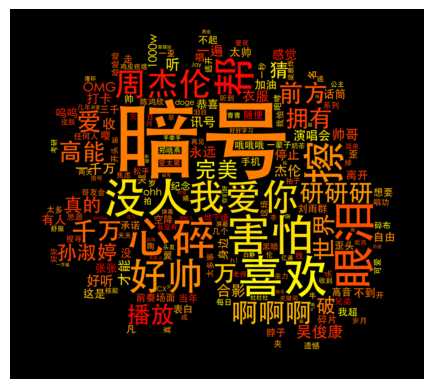

In [83]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/flower.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='autumn',
                         width=800, height=400,
                         collocations=False,
                         scale = 1,
                         mask=pic,
                         ranks_only = True
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

### 🎲 WordCloud 参数讲解：random_state（随机种子）

#### 📌 参数作用：
- 控制词云中**词语位置、角度、颜色**等排布的随机性
- 设置 `random_state=固定整数` 可**保证每次生成的图一致**
- 不设置时，每次生成的图像略有不同（默认随机种子）

#### 🎯 使用建议：

| 场景                         | 是否建议设置 `random_state` |
|------------------------------|------------------------------|
| 论文/报告插图（需可复现）      | ✅ 建议设定，如 `random_state=42` |
| 创意海报/每次风格不同         | ❌ 保持默认                     |
| 多图对比实验                  | ✅ 固定种子确保变量一致        |

> 📌 `random_state` 与 Python 中的 `random.seed()` 功能相似，是保证随机过程“可控”的关键手段


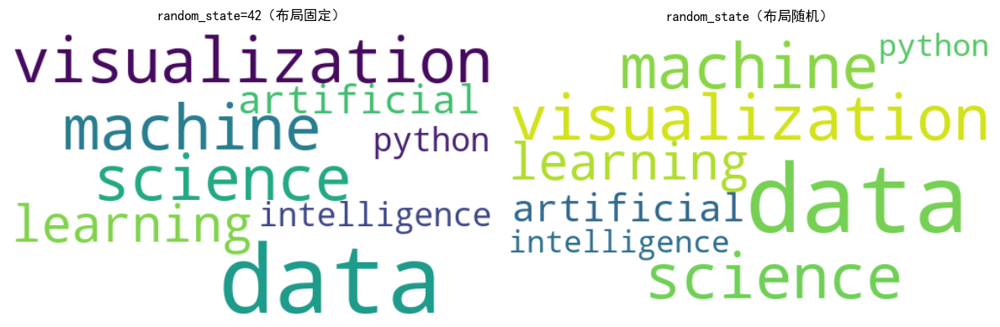

In [54]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

text = "data visualization data science machine learning artificial intelligence python"

# 设置随机种子（固定词云样式）
wc_fixed = WordCloud(width=500, height=300, background_color="white", random_state=42)
wc_fixed.generate(text)

# 不设置随机种子（每次词语位置可能不同）
wc_random = WordCloud(width=500, height=300, background_color="white")
wc_random.generate(text)

# 展示对比图
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(wc_fixed, interpolation="bilinear")
axes[0].set_title("random_state=42（布局固定）", fontsize=12)
axes[0].axis("off")

axes[1].imshow(wc_random, interpolation="bilinear")
axes[1].set_title("random_state（布局随机）", fontsize=12)
axes[1].axis("off")

plt.tight_layout()
plt.show()

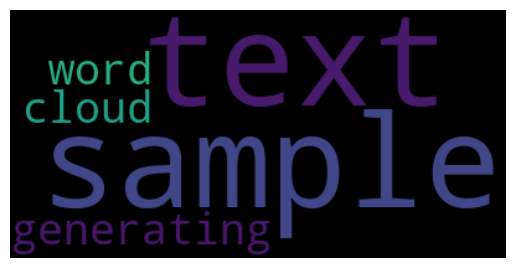

In [58]:
#示例：
from wordcloud import WordCloud

text = "This is a sample text for generating a word cloud"
wc = WordCloud(random_state=7).generate(text)
#生成词云
#词云展示
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

# 常用方法

## 词云生成相关

### 根据词频字典生成 fit_words()

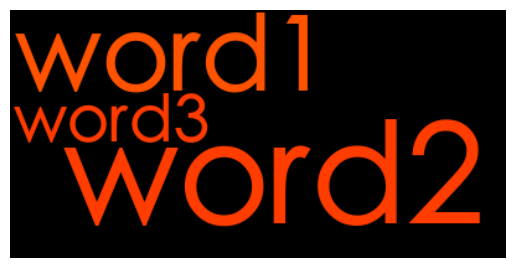

In [89]:
#示例：   
frequencies = {'word1': 100, 'word2': 200, 'word3': 50}
from wordcloud import WordCloud
wordcloud = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='autumn').fit_words(frequencies)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### 常用 generate()

### 根据词频字典生成generate_from_frequencies()

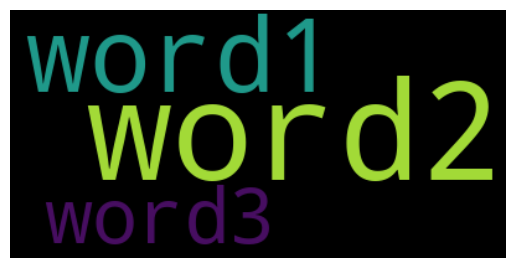

In [106]:
#示例：
frequencies = {'word1': 10, 'word2': 20, 'word3': 5}
from wordcloud import WordCloud
wordcloud = WordCloud().generate_from_frequencies(frequencies)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### 根据文本生成generate_from_text()

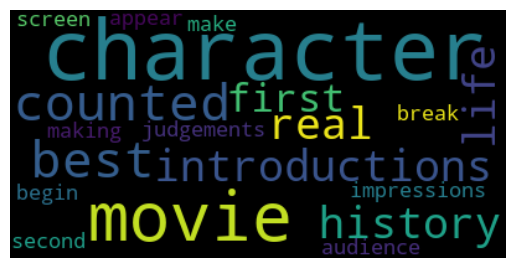

In [47]:
#示例：
from wordcloud import WordCloud

with open('text/movies.txt') as f:
    text = f.read()

wordcloud = WordCloud().generate_from_text(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

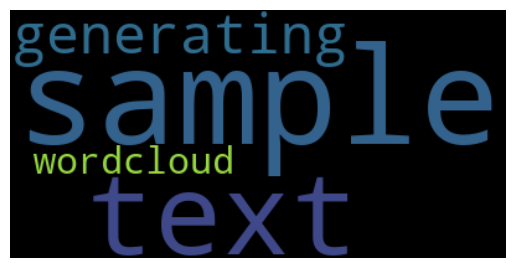

In [48]:
#或者直接使用字符串：
wordcloud = WordCloud().generate_from_text("This is a sample text for generating a wordcloud")
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### 词频统计 process_text()

In [49]:
frequencies = WordCloud().process_text("This is a sample text for generating a wordcloud")
print(frequencies)

{'sample': 1, 'text': 1, 'generating': 1, 'wordcloud': 1}


### 🎨 WordCloud 方法 `.recolor()`

`.recolor()` 是 `WordCloud` 类中的方法，用于在不改变词云结构的情况下，**重新上色**。

---

#### 📌 作用：
- 保持词语的位置、大小、频率不变
- 重新指定颜色方案，适合快速切换配色风格

---

#### 📋 使用场景：
- 多个配色方案对比
- 动态主题词云切换（如“亮色模式”“暗色模式”）
- 根据词频、词性、情感等自定义上色规则

---

#### 🧠 方法语法：

```python
wordcloud.recolor(color_func=...)


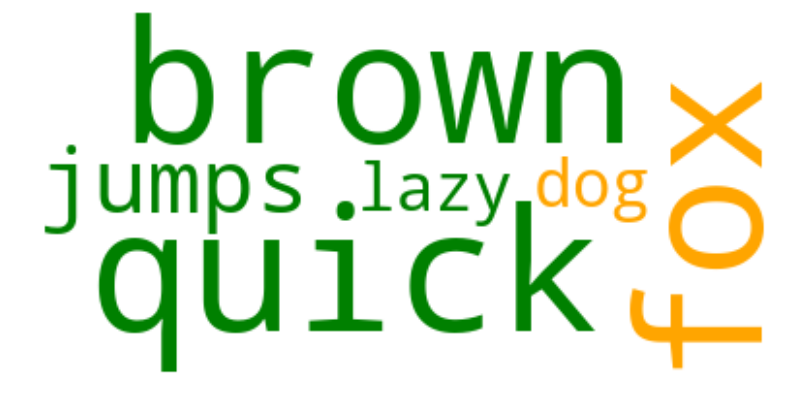

In [152]:
from wordcloud import WordCloud
import numpy as np
import matplotlib.pyplot as plt

# 创建一些示例文本
text = "The quick brown fox jumps over the lazy dog. " * 1000

# 定义一个颜色函数
def custom_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    # 根据单词长度设置颜色
    if len(word) < 4:
        return "orange"
    elif len(word) < 8:
        return "green"
    else:
        return "purple"

# 创建 WordCloud 对象并使用自定义颜色函数
wordcloud = WordCloud(max_words=200, background_color="white", collocations=False).generate(text)
wordcloud = wordcloud.recolor(color_func=custom_color_func)

# 显示词云
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## 文件保存

### 🧾 WordCloud 方法 `.to_array()`

`.to_array()` 是 `WordCloud` 类中用于**将词云图转换为 NumPy 图像数组**的方法。

---

#### 📌 作用：
- 返回一个形如 `(height, width, 3)` 的 **RGB 图像矩阵**
- 每个像素值是 `[R, G, B]`，范围为 0~255
- 可以配合图像处理库（如 PIL、OpenCV、scikit-image）使用

---

#### 🎯 使用场景：
- 保存为图像文件（如 PNG）
- 图像预处理（滤波、灰度化、边缘检测等）
- 输入到深度学习模型作为特征图
- 多张词云叠加、图像融合等高级应用

---

#### ✅ 常见用途：

- 使用 `PIL.Image.fromarray()` 保存为图片：
```python
Image.fromarray(wordcloud.to_array()).save("output.png")


In [11]:
#示例：
wordcloud = WordCloud().generate_from_text("This is a sample text for generating a wordcloud")
wordcloud_array = wordcloud.to_array()
print(wordcloud_array)

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]


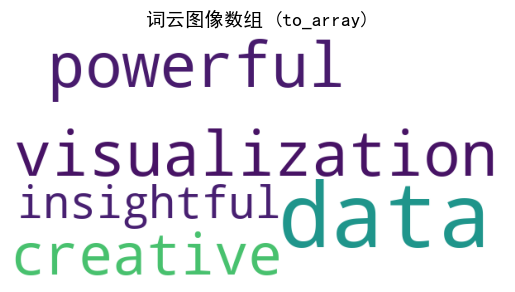

In [33]:
## 💻 示例代码块：`.to_array()` 保存为图像数组并显示

from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

# 示例文本
text = "data visualization is powerful and creative and insightful"

# 生成词云
wc = WordCloud(width=600, height=300, background_color="white").generate(text)

# 使用 to_array 获取 NumPy 图像矩阵
img_array = wc.to_array()
print(img_array)

# 显示图像
plt.imshow(img_array)
plt.axis("off")
plt.title("词云图像数组 (to_array)", fontsize=14)
plt.show()

# 保存为 PNG 文件
Image.fromarray(img_array).save("img/wordcloud_array_output.png")


### 💾 WordCloud 方法 `.to_file(filename)`

`.to_file()` 是 `WordCloud` 类中用于**将词云图直接保存为图像文件（如 PNG、JPG）**的方法。

---

#### 📌 作用：
- 将当前生成的词云图以指定格式保存到磁盘文件中
- 不需要再通过 `plt.savefig()` 或 PIL 手动处理

---

#### 🧠 方法语法：
```python
wordcloud.to_file("文件路径/文件名.扩展名")


In [5]:
#示例：
wordcloud = WordCloud().generate_from_text("This is a sample text for generating a wordcloud")
wordcloud.to_file('img/test.png')

### 🖼️ WordCloud 方法 `.to_image()`

`.to_image()` 是 `WordCloud` 类中的方法，用于**将生成的词云图转换为一个 PIL 图像对象**，可以进一步操作或显示。

---

#### 📌 作用：
- 返回一个 `PIL.Image.Image` 类型对象
- 可以用来在 Python 中进行图像操作、保存、叠加、滤镜处理等
- 可配合 `IPython.display.display()` 或 `image.show()` 显示图片

---

#### 🧠 方法语法：

```python
img = wordcloud.to_image()

| 方法           | 类型返回               | 是否可进一步处理       | 是否可显示            | 是否支持保存                |
| ------------ | ------------------ | -------------- | ---------------- | --------------------- |
| `to_array()` | NumPy ndarray      | ✅ OpenCV/Numpy | ✅ `plt.imshow()` | ✅ 需 `PIL.fromarray()` |
| `to_image()` | PIL.Image.Image 对象 | ✅ PIL 操作       | ✅ `.show()`      | ✅ `.save()`           |


In [6]:
wd = WordCloud().generate_from_text("This is a sample text for generating a wordcloud")
image = wd.to_image()
image.show()
# 可选：保存为 PNG 文件
image.save("img/wordcloud_pil_output.png")

### 🖍️ WordCloud 方法 `.to_svg()`

`.to_svg()` 是 `WordCloud` 类中用于**将词云图转换为 SVG 矢量图格式字符串**的方法。

---

#### 📌 作用：
- 将词云以 SVG 矢量图格式表示（返回字符串形式）
- 可放大、缩小不失真，适用于网页嵌入、打印出版、高分辨率展示等场景

---

#### 🧠 方法语法：

```python
svg_string = wordcloud.to_svg()


### 📊 WordCloud 图像导出方法对比表

| 方法             | 返回类型              | 可否直接显示 | 可否缩放不失真 | 可否进一步处理 | 是否可保存为文件 | 典型用途                         |
|------------------|------------------------|----------------|------------------|-------------------|--------------------|----------------------------------|
| `.to_file()`     | 图像文件（PNG/JPG）    | ✅（用浏览器/IDE） | ❌ 位图           | ❌ 仅静态图        | ✅（自动保存）        | 最常见用法，保存为报告插图        |
| `.to_array()`    | NumPy 数组（RGB 图）   | ✅（用 `plt.imshow`） | ❌ 位图           | ✅ OpenCV/PIL/Numpy | ✅（需用 `Image.fromarray()`） | 图像处理、机器学习、可视化研究    |
| `.to_image()`    | PIL 图像对象           | ✅（`.show()` 或 `display()`） | ❌ 位图       | ✅ PIL 滤镜、水印、剪裁等 | ✅（`.save()`）         | 图像编辑、图像合成、手动保存        |
| `.to_svg()`      | SVG 字符串（矢量图）   | ✅（浏览器或 HTML） | ✅ 无限缩放        | ✅（支持 AI/PPT 编辑） | ✅（`.write()`）       | 网页嵌入、高分辨率输出、出版级编辑 |


In [59]:
from wordcloud import WordCloud
import jieba

# 原始中文文本
text = "数据可视化是一种将复杂数据转换为图形图像的技术，可以帮助我们更好地理解数据结构、发现规律、传达信息。"

# 使用 jieba 进行中文分词
words = jieba.lcut(text)
cut_text = " ".join(words)  # 用空格连接，适配 WordCloud 的输入要求

# 设置字体路径（macOS 默认中文字体）
font_path = "/System/Library/Fonts/STHeiti Medium.ttc"

# 创建词云对象并生成
wc = WordCloud(
    font_path=font_path,
    width=600,
    height=300,
    background_color="white"
).generate(cut_text)

# 输出 SVG 内容
svg = wc.to_svg()

# 保存为 SVG 文件
with open("img/chinese_wordcloud.svg", "wb") as f:
    f.write(svg.encode("utf-8"))

print("✅ 中文词云已成功保存为 SVG 文件：chinese_wordcloud.svg")


✅ 中文词云已成功保存为 SVG 文件：chinese_wordcloud.svg


# 关于词云背景图片

## 将图片背景色转换为白色

In [60]:
from PIL import Image
import os

def convert_background_to_white(image_path):
    # 获取原始图片文件名
    original_filename = os.path.basename(image_path)

    # 打开图片
    image = Image.open(image_path)

    # 将图片转换为RGBA模式
    image = image.convert("RGBA")

    # 获取图片的尺寸
    width, height = image.size

    # 遍历图片的每个像素
    for x in range(width):
        for y in range(height):
            # 获取当前像素的颜色
            r, g, b, a = image.getpixel((x, y))

            # 如果当前像素的颜色接近黑色，则将其颜色设置为白色
            if r < 100 and g < 100 and b < 100:
                image.putpixel((x, y), (255, 255, 255, a))

    # 创建保存目录
    save_dir = os.path.join(os.path.dirname(image_path), "converted_img")
    os.makedirs(save_dir, exist_ok=True)

    # 构建输出文件路径
    output_filename = f"mask_{os.path.splitext(original_filename)[0]}.png"
    output_path = os.path.join(save_dir, output_filename)

    # 保存修改后的图片
    image.save(output_path)

# 使用函数
convert_background_to_white("img/white_bg.jpg")

## 将图片背景色转换为黑白二值化的图像

In [38]:
from PIL import Image
import numpy as np

# 打开原始图像
original_image = Image.open("img/jay.jpg")

# 将图像转换为numpy数组
image_array = np.array(original_image)

# 将RGB值转换为灰度值
grayscale_array = np.sum(image_array * np.array([0.299, 0.587, 0.114]), axis=-1)

# 将灰度值二值化
mask_array = np.where(grayscale_array > 128, 255, 0)

# 将二值化的numpy数组转换回Image对象
mask_image = Image.fromarray(mask_array.astype('uint8'))

# 保存mask图像
mask_image.save("img/converted_img/mask_jay.png")

## 词云背景设置示例

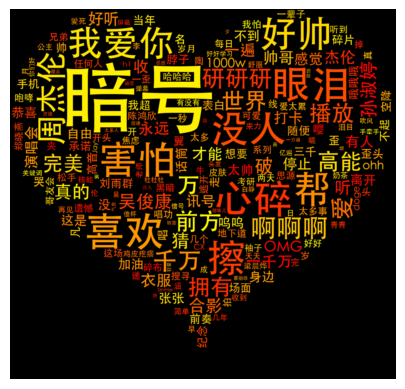

In [142]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/mask_white_bg.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='autumn',
                         width=800, height=400,
                         collocations=False,
                         scale = 1,
                         mask=pic,
                         ranks_only = True
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

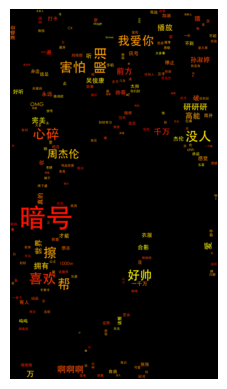

In [39]:
#示例：
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from PIL import Image

pic = np.array(Image.open("img/converted_img/mask_jay.png"))

#读取用于生成词云的TXT文件
f = open('text/anhao_dm.txt', 'r', encoding='UTF-8')
txt= f.read()

#生成词云
wd_0 = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc',
                         colormap='autumn',
                         width=800, height=400,
                         collocations=False,
                         scale = 1,
                         mask=pic,
                         ranks_only = True
                         ).generate(txt)
#词云展示
plt.imshow(wd_0, interpolation='bilinear')
plt.axis("off")
plt.show()

# 基于Python的分词实例

## 分词实例之JiebaHello

### 🧠 jieba 中文分词的 4 种常见模式

`jieba` 是 Python 中最常用的中文分词工具，提供多种分词模式，适用于不同的应用场景。

---

#### 1️⃣ 全模式 `cut_all=True`

- 将句子中**所有可能的词语**都扫描出来，速度快，但不能解决歧义
- 适合：关键词提取、搜索引擎构建倒排索引前的**高 recall** 场景

**示例：**
```python
jieba.cut("我来到北京清华大学", cut_all=True)
# 输出：我/ 来到/ 北京/ 清华/ 清华大学/ 华大/ 大学



#### 2️⃣ 精确模式 `cut_all=False`

- 精确地切分句子，尽量减少冗余，是 `jieba.cut()` 的默认模式
- 适合：文本分析、自然语言处理、词云、情感分析等

```python
seg_list = jieba.cut("我来到北京清华大学", cut_all=False)
print("【精确模式】: " + "/ ".join(seg_list))
#【精确模式】: 我/ 来到/ 北京/ 清华大学


#### 3️⃣ 默认模式（默认即为 `cut_all=False`）

- 不传参数时默认使用精确模式
- 具有一定**新词识别能力**（如“杭研”作为新词）

```python
seg_list = jieba.cut("他来到了网易杭研大厦")
print("【默认模式】: " + "/ ".join(seg_list))
#【默认模式】: 他/ 来到/ 了/ 网易/ 杭研/ 大厦


#### 4️⃣ 搜索引擎模式 `cut_for_search()`

- 在精确模式基础上，将长词进一步切分
- 适合：搜索引擎建立倒排索引，提升召回率

```python
seg_list = jieba.cut_for_search("小明硕士毕业于中国科学院计算所，后在日本京都大学深造")
print("【搜索引擎模式】: " + "/ ".join(seg_list))
#【搜索引擎模式】: 小明/ 硕士/ 毕业/ 于/ 中国/ 科学院/ 中国科学院/ 计算/ 计算所/ 日本/ 京都/ 大学


| 模式           | 函数调用方式                           | 适用场景          | 分词特点                        |
| ------------ | -------------------------------- | ------------- | --------------------------- |
| **精确模式**（默认） | `jieba.cut(text, cut_all=False)` | 词频统计、文本建模、词云  | 准确、清晰，适合语义分析                |
| **全模式**      | `jieba.cut(text, cut_all=True)`  | 搜索引擎索引构建（高召回） | 所有可能的词都切出，有重复、歧义但不漏掉短词      |
| **搜索引擎模式**   | `jieba.cut_for_search(text)`     | 构建倒排索引        | 在精确模式基础上，把长词再切一刀，适合高 recall |


In [18]:
import jieba

text = "我在清华五道口金融学院学习碳达峰路径。"

# 全模式
print("🔁 全模式 cut_all=True:")
print(" / ".join(jieba.cut(text, cut_all=True)))

# 精确模式
print("\n✅ 精确模式 cut_all=False:")
print(" / ".join(jieba.cut(text, cut_all=False)))

# 搜索引擎模式
print("\n🔍 搜索引擎模式 cut_for_search():")
print(" / ".join(jieba.cut_for_search(text)))


🔁 全模式 cut_all=True:
我 / 在 / 清华 / 五道 / 五道口 / 道口 / 金融 / 金融学 / 金融学院 / 学院 / 学习 / 碳 / 达 / 峰 / 路径 / 。

✅ 精确模式 cut_all=False:
我 / 在 / 清华 / 五道口 / 金融 / 学院 / 学习 / 碳达峰 / 路径 / 。

🔍 搜索引擎模式 cut_for_search():
我 / 在 / 清华 / 五道 / 道口 / 五道口 / 金融 / 学院 / 学习 / 碳达峰 / 路径 / 。


## 添加词典之JiebaDict

In [68]:
import jieba

jieba.add_word("清华五道口")
jieba.add_word("碳达峰碳中和", freq=10000, tag="n")  # 可选：添加词频和词性

text = "清华五道口是著名的金融研究基地，聚焦碳达峰碳中和。"
print("/ ".join(jieba.cut(text)))


清华五道口/ 是/ 著名/ 的/ 金融/ 研究/ 基地/ ，/ 聚焦/ 碳达峰碳中和/ 。


In [70]:
import jieba
jieba.load_userdict("text/mydict.txt")
text = "我们在清华五道口学习碳达峰碳中和路径和ChatGPT原理。"
print("【自定义词典切词结果】：")
print("/ ".join(jieba.cut(text)))


【自定义词典切词结果】：
我们/ 在/ 清华五道口/ 学习/ 碳达峰碳中和/ 路径/ 和/ ChatGPT/ 原理/ 。


## 词性标注之JiebaToken

In [71]:
import jieba.posseg as pseg
words=pseg.cut("中国国家领导人在开会")
for key in words:
    print(key.word,key.flag)

中国 ns
国家 n
领导人 n
在 p
开会 v


# 影视剧小说词云图案例分析

## Python分词程序

In [123]:
import jieba

with open('text/renmin.txt', 'r',encoding='UTF-8') as f:
    renmin=f.read()

jieba.load_userdict("text/renminDict.txt")  #添加词典
seg_list = jieba.cut(renmin, cut_all=False) #分词
print("【精确模式】: " + "/ ".join(seg_list))

【精确模式】: 侯亮平/ 带/ 着/ 陆亦可/ 在/ 高速公路/ 上/ 堵/ 着/ 李达康/ 的/ 专车/ ，/ 直接/ 将/ 他/ 的/ 老婆/ 欧阳箐/ 给/ 带走/ 了/ ，/ 这下/ 算是/ 捅/ 了/ 马蜂窝/ 了/ ，/ 随后/ 的/ 李达康/ 便/ 给/ 季昌明/ 一顿/ 骂/ ，/ 又/ 找到/ 了/ 自己/ 的/ 亲信/ 赵东来/ ，/ 跟/ 他/ 了解/ 欧阳箐/ 的/ 情况/ ，/ 可以/ 说/ ，/ 李达康/ 的/ 这波/ 技术性/ 离婚/ 操作/ ，/ 如果/ 沙瑞金/ 定型/ 是/ 老婆/ ，/ 那/ 李达康/ 算是/ 彻底/ 栽/ 了/ ，/ 可/ 问题/ 是/ 最/ 着急/ 的/ 人/ ，/ 不是/ 李达康/ ，/ 反而/ 是/ 祁同伟/ 。/ 
/ 当时/ ，/ 祁同伟/ 那/ 叫/ 一个/ 着急/ ，/ 连忙/ 跟/ 自己/ 的/ 手下/ 程度/ 直言/ ，/ 让/ 他/ 不要/ 轻易/ 发表/ 任何/ 言论/ ，/ 后来/ ，/ 更是/ 让/ 程度/ 以后/ 不要/ 轻易/ 去/ 请/ 侯亮平/ ，/ 接着/ 更是/ 找到/ 了/ 高育良/ ，/ 对/ 着/ 侯亮平/ 便是/ 一顿/ 输出/ ，/ 在/ 背后/ 说/ 侯亮平/ 的/ 闲话/ ，/ 高育良/ 对此/ 没有/ 发一言/ ，/ 但/ 从/ 他/ 脸上/ 的/ 表情/ 能/ 看/ 出来/ ，/ 祁同伟/ 让/ 他/ 很/ 是/ 反感/ ，/ 换/ 做/ 是/ 别人/ ，/ 可能/ 也/ 早就/ 开骂/ 了/ ，/ 那/ 问题/ 是/ 祁同伟/ 干嘛/ 那么/ 着急/ 呢/ ？/ 
/ 毕竟/ 再/ 怎么/ 看/ ，/ 祁同伟/ 跟/ 李达康/ 的/ 关系/ 并/ 不是/ 很大/ ，/ 再/ 加上/ 之前/ 在/ 常委会/ 上/ ，/ 李达康/ 公开/ 揭老底/ ，/ 把/ 祁同伟/ 哭坟/ 的/ 事情/ 拿/ 出来/ 一顿/ 说/ ，/ 这/ 已经/ 算是/ 挑明/ 了/ 他/ 和/ 李达康/ 的/ 关系/ 了/ ，/ 这时候/ ，/ 祁同伟/ 再/ 着急/ 也/ 没用/ ，/ 反倒/ 回来/ 应该/ 感到/ 幸灾乐祸/ 才/ 对/ ，/ 毕竟/ 他/ 当初/ 都/ 快/ 把/ 李达康/ 当爹/ 供/ 着/ 了/ ，/ 可/ 他/ 却/ 这么/ 对/ 自己/ 。/ 
/

In [124]:
import jieba
from collections import Counter

with open('text/renmin.txt', 'r', encoding='UTF-8') as f:
    renmin = f.read()

jieba.load_userdict("text/renminDict.txt")  # 添加词典
seg_list = jieba.cut(renmin, cut_all=False)  # 分词
# print("【精确模式】: " + "/ ".join(seg_list))  # 这行代码不是必需的,如果不需要打印分词结果,可以注释掉

# 统计词频
word_counts = Counter(seg_list)

# 输出词语和词频
print("词语和词频（词频大于2）：")
for word, freq in word_counts.most_common():  # 按照词频从高到低排序
    if freq > 2:
        print(f"{word}: {freq}")

词语和词频（词频大于2）：
，: 50
的: 19
了: 13
李达康: 12
他: 11
是: 11
祁同伟: 8
在: 5
侯亮平: 4
着: 4
自己: 4
那: 4
着急: 4
对: 4
算是: 3
一顿: 3
跟: 3
说: 3
。: 3

: 3
让: 3
再: 3


In [55]:
import jieba
from collections import Counter

with open('text/renmin.txt', 'r', encoding='UTF-8') as f:
    renmin = f.read()

jieba.load_userdict("text/renminDict.txt")  # 添加词典
seg_list = jieba.cut(renmin, cut_all=False)  # 分词

# 读取停用词列表
with open('text/stopword.txt', 'r', encoding='UTF-8') as ft:
    stopwords = ft.read().split()

# 过滤停用词并统计词频
filtered_words = [word for word in seg_list if word not in stopwords and len(word) >= 2 and '一' not in word]
word_counts = Counter(filtered_words)

# 输出词语和词频
print("词语和词频（词频大于2）：")
for word, freq in word_counts.most_common():  # 按照词频从高到低排序
    if freq > 2:
        print(f"{word}: {freq}")

# 输出词语和词频到文件
with open('text/result.txt', 'w', encoding='UTF-8') as f:
    for word, freq in word_counts.most_common():  # 按照词频从高到低排序
        if freq > 2:
            f.write(f"{word}: {freq}\n")

print("词语和词频（词频大于2）已写入文件 result.txt")

词语和词频（词频大于2）：
李达康: 12
祁同伟: 8
侯亮平: 4
着急: 4
算是: 3
词语和词频（词频大于2）已写入文件 result.txt


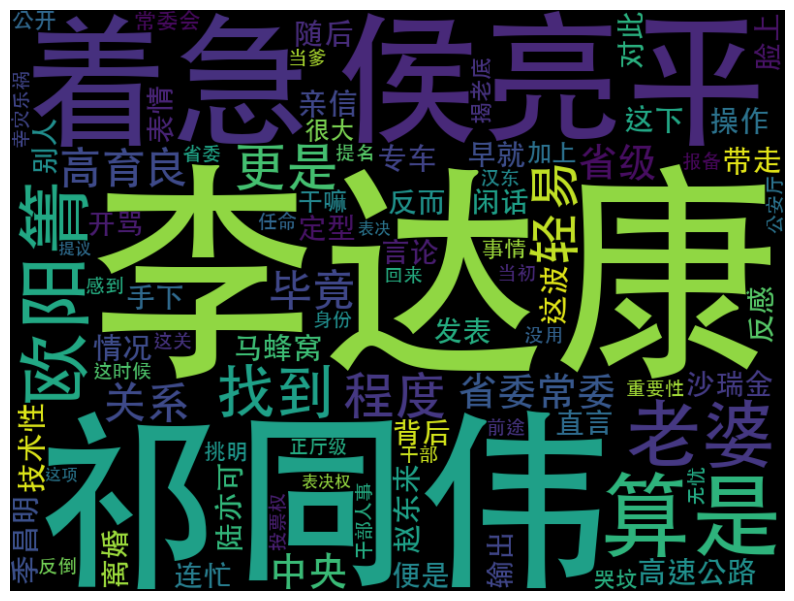

In [56]:
import jieba
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

with open('text/renmin.txt', 'r', encoding='UTF-8') as f:
    renmin = f.read()

jieba.load_userdict("text/renminDict.txt")  # 添加词典
seg_list = jieba.cut(renmin, cut_all=False)  # 分词

# 读取停用词列表
with open('text/stopword.txt', 'r', encoding='UTF-8') as ft:
    stopwords = ft.read().split()

# 过滤停用词并统计词频
filtered_words = [word for word in seg_list if word not in stopwords and len(word) >= 2 and '一' not in word]
word_counts = Counter(filtered_words)

# 生成词云
wordcloud = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc', width=800, height=600, max_words=200).generate_from_frequencies(word_counts)

# 显示词云图像
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# 保存词云图像
wordcloud.to_file("img/wordcloud.png")

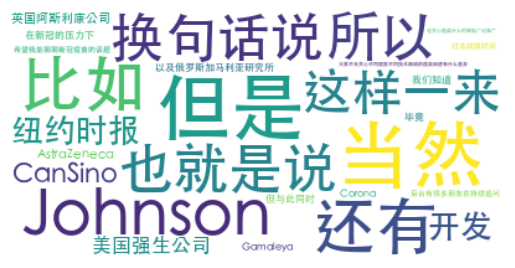

In [73]:
from wordcloud import WordCloud
import jieba
import matplotlib.pyplot as plt
with open('text/article.txt','r',encoding='UTF-8')  as f:
 mytext = f.read()
cut_text =" ".join(jieba.cut(mytext))

cloud = WordCloud(
       #设置字体，不指定就会出现乱码
       font_path="/System/Library/Fonts/STHeiti Medium.ttc",
       #font_path=path.join(d,'simsun.ttc'),
       #设置背景色
       background_color='white',
       #词云形状
       max_words=4000,
       #最大号字体
       max_font_size=60)

wordcloud = cloud.generate(mytext)
plt.imshow(wordcloud,interpolation="bilinear")
plt.axis("off")
plt.show()

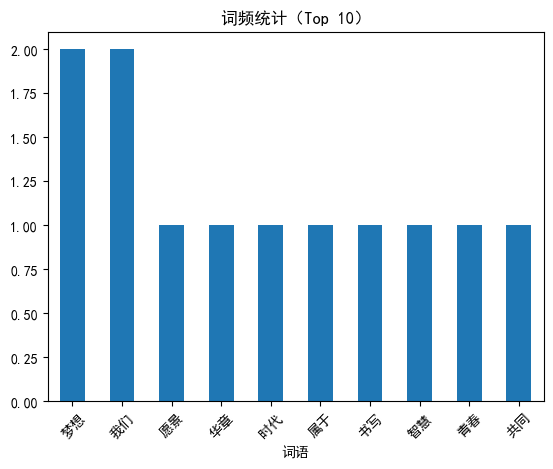

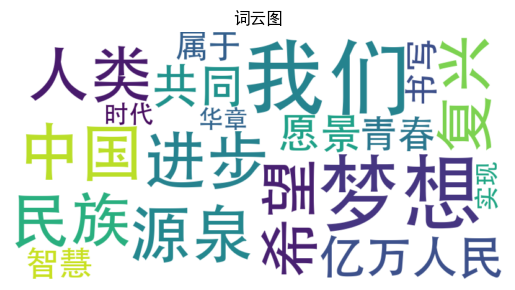

In [17]:
# 第一步：导入基础库
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = ['SimHei']  # 使用黑体显示中文
plt.rcParams['axes.unicode_minus'] = False    # 正常显示负号
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from wordcloud import WordCloud
import jieba  # 中文分词
import warnings
warnings.filterwarnings('ignore')


# 第二步：加载文本
text = """
梦想，是人类进步的源泉。中国梦，是民族复兴的希望，是亿万人民的共同愿景。
我们要用青春和智慧，书写属于新时代的华章，实现我们的梦想。
"""

# 第三步：中文分词
words = jieba.lcut(text)
words = [w for w in words if len(w) > 1]  # 去除单字词

# 第四步：统计词频
word_freq = Counter(words)

# 第五步：可视化——柱状图
df = pd.DataFrame(word_freq.items(), columns=["词语", "频次"]).sort_values(by="频次", ascending=False).head(10)
df.plot.bar(x="词语", y="频次", title="词频统计（Top 10）", legend=False)
plt.xticks(rotation=45)
plt.show()

# 第六步：可视化——词云图
wc = WordCloud(font_path='/System/Library/Fonts/STHeiti Medium.ttc', background_color="white", width=800, height=400)
wc.generate_from_frequencies(word_freq)
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("词云图")
plt.show()


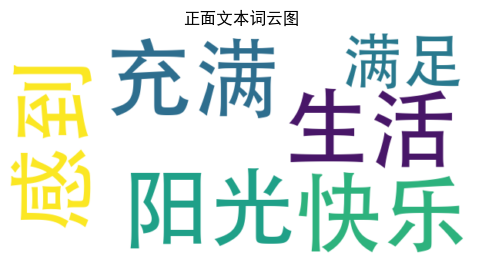

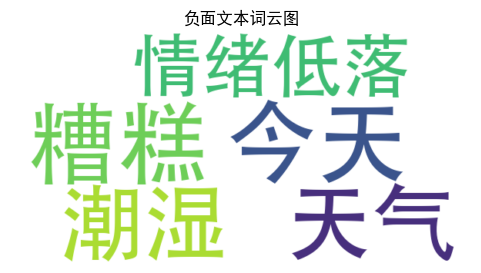

In [23]:
import warnings
warnings.filterwarnings('ignore')

import jieba
import matplotlib.pyplot as plt
from collections import Counter
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
import networkx as nx
import pandas as pd
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False

text_pos = "生活充满阳光，我感到非常快乐和满足。"
text_neg = "今天非常糟糕，天气又冷又潮湿，我情绪低落。"
texts = [text_pos, text_neg]
labels = ["正面", "负面"]
stopwords = set("的 了 是 我 和 有 在 又 非常 很 都 不 一些".split())
def preprocess(text):
    words = jieba.lcut(text)
    return [w for w in words if len(w) > 1 and w not in stopwords]

segmented = [preprocess(t) for t in texts]
segmented_strs = [" ".join(words) for words in segmented]
for i, label in enumerate(labels):
    # 创建 WordCloud 对象，设置中文字体和图像大小
    wc = WordCloud(
        font_path='/System/Library/Fonts/STHeiti Medium.ttc',  # 确保字体文件在目录中
        background_color="white",
        width=600,
        height=300
    )

    # 生成词云图数据
    wc.generate(" ".join(segmented[i]))

    # 绘图展示
    plt.figure(figsize=(6, 3))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"{label}文本词云图")
    plt.show()

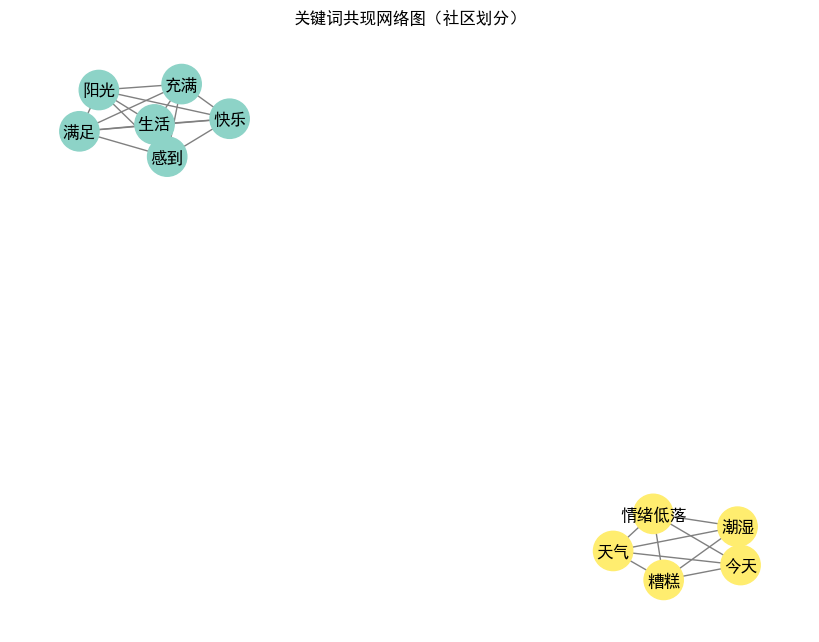

In [21]:
from itertools import combinations
from networkx.algorithms.community import greedy_modularity_communities

# 构建共现词对计数器（去重组合）
co_matrix = Counter()
for words in segmented:
    for pair in combinations(sorted(set(words)), 2):
        co_matrix[pair] += 1

# 创建网络图（只添加共现次数 >= 1 的词对）
G = nx.Graph()
for (w1, w2), count in co_matrix.items():
    if count >= 1:
        G.add_edge(w1, w2, weight=count)

# 使用社区检测算法进行词簇划分
communities = list(greedy_modularity_communities(G))

# 给每个节点一个颜色分类
color_map = {}
for i, community in enumerate(communities):
    for word in community:
        color_map[word] = i
colors = [color_map[node] for node in G.nodes()]

# 绘制共现网络图
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G, k=0.5, seed=42)  # 图结构布局
nx.draw(
    G, pos, with_labels=True,
    node_color=colors, cmap=plt.cm.Set3,
    node_size=800, edge_color='gray'
)
plt.title("关键词共现网络图（社区划分）")
plt.axis('off')
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
import jieba

# 示例文本（3条中文句子）
docs = [
    "我今天很快乐，心情很好，感觉很满足。",
    "天气非常冷，心情有点低落。",
    "这真是一次糟糕的经历，让人非常失望。"
]

# 中文分词（用空格连接）
docs_cut = [" ".join(jieba.lcut(doc)) for doc in docs]

# 构建 TF-IDF 特征矩阵
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(docs_cut)

# 转换为 DataFrame
tfidf_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

# 指定我们关注的情感类词汇
emotion_words = ["快乐", "满足", "糟糕", "冷", "低落"]

# 从 TF-IDF 表中选出这几个关键词的列（如果有的话）
emotion_df = tfidf_df[tfidf_df.columns.intersection(emotion_words)]

# 绘制热力图展示不同文本中情感词的权重
plt.figure(figsize=(6, 3))
sns.heatmap(emotion_df, annot=True, cmap="YlGnBu")  # annot=True 显示具体数值
plt.title("情感关键词 TF-IDF 热力图")
plt.xlabel("情感词")
plt.ylabel("文本编号")
plt.show()
